# Deferment Analysis Under Well Category using 2016 – 2019 Data

## Current PD and UPD Optimization Effort by Wells, COE

### April 2020

#### Work by: Faiz Fablillah

This report is prepared to support the strategic plan to optimize PD and UPD for Malaysia asset with a holistic analysis focusing on well category. Deferment data gathered from DART dated year of 2016 to 2019 in order to complete the analysis.

### 1. Summary

The main aim of this report is to analyze deferment data from 2016 to 2019 which recorded information of deferment ocurrence, its details and hydrocarbon lost as a result of this deferment. This report also is intended to provide main observations about deferment pattern of all companies in all assets/regions. Finally, we will strive to provide some recommendation based on the findings and pattern.

### 2. Technologies  & Techniques

Total Analysis is done in `Python` and is maintained in `Jupyter notebook` which can be rerun by anyone to reproduce same results with given data. `Pandas` is the primary library used for loading and maintaining data along with manipulations on columns with `NumPy` as a general-purpose array-processing package. `Matplotlib` is also part of the primary library used for all visualisation.

### 3. Preparing Data

In [1]:
# Import libraries and tools
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import hvplot.pandas
from wordcloud import WordCloud, STOPWORDS 
import plotly.express as px
import seaborn as sns

import datetime
from collections import Counter, OrderedDict
import warnings

warnings.filterwarnings("ignore")
pd.set_option("max_columns", 35)

In [2]:
# Combine all sheets into a single dataframe
df = pd.read_excel('Deferment 2016-2019.xlsx', sheet_name=None, ignore_index=True)
cdf = pd.concat(df.values(), ignore_index=True)
cdf['year'] = pd.DatetimeIndex(cdf['END_DATE']).year

In [3]:
# Export the combined file into Excel format
# cdf.to_excel("deferment_2016_2019_final.xlsx")

In [4]:
cdf.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
0,PMO,ANSI,ANSI-A009R01-LS,2016-01-01,2016-01-31,N-Non-Planned,P-Process,LA - Air Intake System,NaN,2.130748e+06,15.952755,NaN,6.392243e+07,478.58265,NaN,NaN,NaN,2016.0
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0
3,PMO,ANSI,ANSI-A023-LS,2016-01-01,2016-01-31,P-Planned,P-Process,LA - Air Intake System,NaN,5.873152e+06,0.000000,NaN,1.761905e+08,0.00000,NaN,NaN,NaN,2016.0
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0


In [5]:
cdf.tail()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
118991,SKOIL,BARM,BARM-F094-TS,2019-12-30,2019-12-30,U-Unplanned,P-Process,KM - Others,117.660989,79130.0,NaN,9.805082,6.594167e+03,NaN,NaN,NaN,BAJT-F station PSD @ 1400 hrs (30/12) due to s...,2019.0
118992,SKOIL,BARM,BARM-F102-LS,2019-12-30,2019-12-30,U-Unplanned,P-Process,KM - Others,156.953446,218202.0,NaN,13.079454,1.818350e+04,NaN,NaN,NaN,BAJT-F station PSD @ 1400 hrs (30/12) due to s...,2019.0
118993,SKOIL,BARM,BARM-F068-TS,2019-12-30,2019-12-30,U-Unplanned,P-Process,KM - Others,76.302193,52000.0,NaN,6.358516,4.333333e+03,NaN,NaN,NaN,BAJT-F station PSD @ 1400 hrs (30/12) due to s...,2019.0
118994,SKOIL,BARM,BARM-F071-TS,2019-12-30,2019-12-30,U-Unplanned,P-Process,KM - Others,299.223314,84100.0,NaN,24.935276,7.008333e+03,NaN,NaN,NaN,BAJT-F station PSD @ 1400 hrs (30/12) due to s...,2019.0
118995,SKOIL,BARM,BARM-F101-LS,2019-12-30,2020-12-30,U-Unplanned,P-Process,KM - Others,50.326630,58830.0,NaN,18423.740290,2.153668e+07,NaN,NaN,NaN,BAJT-F station PSD @ 1400 hrs (30/12) due to s...,2020.0


In [6]:
# Checking shapes of our data

print(cdf.size)
print(cdf.shape)

2141928
(118996, 18)


### 4. First Level of Analysis

#### 4.1 Filtering data for well category and year until 2019

In [20]:
# Filter only well under 'column category'
filtered = cdf[cdf['CATEGORY'].str.contains('W-Well', na=False)]
filtered.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0
15,PMO,PULI,PULI-A001S01-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,150.573658,1.800002e+05,NaN,131.751951,1.575002e+05,NaN,NaN,NaN,NaN,2016.0
16,PMO,PULI,PULI-A004-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,99.129740,2.000002e+05,NaN,86.738523,1.750002e+05,NaN,NaN,NaN,NaN,2016.0


In [21]:
filtered.tail()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
118908,PMO,DULG,DULG-B022-SS,2019-12-30,2019-12-31,U-Unplanned,W-Well,CI - Gas lift design error/robbing,165.378001,4.179142e+05,NaN,130.924251,330848.70980,NaN,NaN,NaN,Intermittent flow suspected due to gas robbing,2019.0
118909,PMO,DULG,DULG-A007-TS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),110.263250,3.020000e+05,NaN,4.594302,12583.33333,NaN,NaN,NaN,Well quit,2019.0
118939,SKOIL,LTGW,LTGW-B030S01-SS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),34.429029,3.700000e+04,NaN,10.041800,10791.66667,NaN,NaN,NaN,Well found quit upon arrival.,2019.0
118977,SKOIL,TMNA,TMNA-W069-TS,2019-12-30,2019-12-30,P-Planned,W-Well,EP - Zone Change,591.055291,2.000000e+05,NaN,172.391127,58333.33333,NaN,NaN,NaN,NaN,2019.0
118988,PMO,DYNG,DYNG-C002-LS,2019-12-30,2019-12-30,P-Planned,W-Well,BY - Xmas tree accessories damage or leak/faul...,NaN,3.082000e+06,9.189,NaN,267179.83830,0.0,NaN,NaN,NaN,2019.0


In [17]:
# Checking shapes of our filted data

print(filtered.size)
print(filtered.shape)

# About 96,203 data has been removed

413514
(22973, 18)


In [23]:
# Next we are removing small data from 2020

filtered_year = filtered[filtered['year']<2020.0]
filtered_year.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0
15,PMO,PULI,PULI-A001S01-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,150.573658,1.800002e+05,NaN,131.751951,1.575002e+05,NaN,NaN,NaN,NaN,2016.0
16,PMO,PULI,PULI-A004-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,99.129740,2.000002e+05,NaN,86.738523,1.750002e+05,NaN,NaN,NaN,NaN,2016.0


In [24]:
filtered_year.tail()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
118908,PMO,DULG,DULG-B022-SS,2019-12-30,2019-12-31,U-Unplanned,W-Well,CI - Gas lift design error/robbing,165.378001,4.179142e+05,NaN,130.924251,330848.70980,NaN,NaN,NaN,Intermittent flow suspected due to gas robbing,2019.0
118909,PMO,DULG,DULG-A007-TS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),110.263250,3.020000e+05,NaN,4.594302,12583.33333,NaN,NaN,NaN,Well quit,2019.0
118939,SKOIL,LTGW,LTGW-B030S01-SS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),34.429029,3.700000e+04,NaN,10.041800,10791.66667,NaN,NaN,NaN,Well found quit upon arrival.,2019.0
118977,SKOIL,TMNA,TMNA-W069-TS,2019-12-30,2019-12-30,P-Planned,W-Well,EP - Zone Change,591.055291,2.000000e+05,NaN,172.391127,58333.33333,NaN,NaN,NaN,NaN,2019.0
118988,PMO,DYNG,DYNG-C002-LS,2019-12-30,2019-12-30,P-Planned,W-Well,BY - Xmas tree accessories damage or leak/faul...,NaN,3.082000e+06,9.189,NaN,267179.83830,0.0,NaN,NaN,NaN,2019.0


In [26]:
# Checking shapes of our filted data

print(filtered_year.size)
print(filtered_year.shape)

# About 332 data has been removed

407538
(22641, 18)


In [27]:
# Export this filtered dataset (after getting for well only) into Excel format
# filtered_year.to_excel("well_deferment_2016_2019_final.xlsx")

#### 4.2 Group data by Type of Deferment

In [28]:
# Group by TYPE and print
event_type = filtered_year.groupby(by = ['TYPE']).count()['CODE'].nlargest(3)
event_type

TYPE
U-Unplanned      11465
P-Planned         9089
N-Non-Planned     2087
Name: CODE, dtype: int64

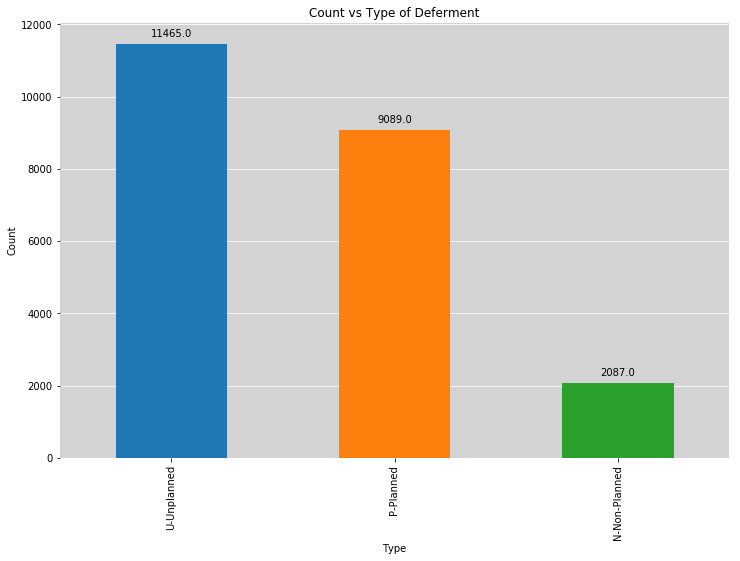

In [29]:
# Visualisation 1

plt.figure(figsize=(12, 8))
ax = event_type.plot(kind='bar')
ax.set_title('Count vs Type of Deferment')
ax.set_xlabel('Type')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True) 

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image1.png")

#### 4.3 Percentage of each Type vs. Total row

In [30]:
# Calculate percentage of each TYPE vs total row
Non_Planned_Percentage = 2145 / len(filtered_year) * 100
Planned_Percentage = 9180 / len(filtered_year) * 100
Unplanned_Percentage = 11648 / len(filtered_year) * 100
Non_Planned_Percentage, Planned_Percentage, Unplanned_Percentage

(9.473963164171193, 40.54591228302637, 51.44649087937812)

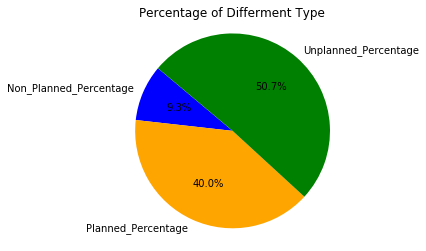

In [31]:
# Visualisation 2
labels = 'Non_Planned_Percentage', 'Planned_Percentage', 'Unplanned_Percentage'
sizes = [9.337047838767248, 39.9599529882906, 50.70299917294216]
colors = ['blue', 'orange', 'green']

# Plot
plt.pie(sizes, explode=None, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=False, startangle=140)

plt.axis('equal')
plt.title("Percentage of Differment Type") 
plt.show()

#Option to save image
#plt.savefig("image2.png")

#### 4.4 Filter file for Malaysia Assets Only

In [32]:
# Query only area of interest
filtered_asset = filtered_year.query('OP_AREA_CODE in ["SKOIL", "PMO", "SBO", "SKGAS"]')
filtered_asset.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0
15,PMO,PULI,PULI-A001S01-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,150.573658,1.800002e+05,NaN,131.751951,1.575002e+05,NaN,NaN,NaN,NaN,2016.0
16,PMO,PULI,PULI-A004-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,99.129740,2.000002e+05,NaN,86.738523,1.750002e+05,NaN,NaN,NaN,NaN,2016.0


#### 4.5 Group by Type of Deferment at Asset level and check occurence

In [33]:
# Group by TYPE & OP_AREA_CODE - i.e. number of events per OP_AREA_CODE and print
event_asset = filtered_asset.groupby(by = ['TYPE', 'OP_AREA_CODE']).count()['CODE'].nlargest(12)
event_asset

TYPE           OP_AREA_CODE
U-Unplanned    SKOIL           5993
               PMO             4504
P-Planned      PMO             4409
               SKOIL           2961
N-Non-Planned  PMO             2025
P-Planned      SBO             1306
U-Unplanned    SBO              776
P-Planned      SKGAS            386
U-Unplanned    SKGAS            168
N-Non-Planned  SBO               36
               SKOIL             23
               SKGAS              2
Name: CODE, dtype: int64

In [34]:
# Calculate percentage of each TYPE & OP_AREA_CODE vs total row
Unplanned_Percentage_SKOIL = 6087/11648*100
Unplanned_Percentage_PMO = 4559/11648*100
Planned_Percentage_PMO = 4425/9180*100
Planned_Percentage_SKOIL = 3002/9180*100
Non_Planned_Percentage_PMO = 2062/2145*100
Planned_Percentage_SBO = 1338/9180*100
Unplanned_Percentage_SBO = 809/11648*100
Planned_Percentage_SKGAS = 387/9180*100
Unplanned_Percentage_SKGAS = 169/11648*100
Non_Planned_Percentage_SBO = 809/2145*100
Non_Planned_Percentage_SKOIL = 24/2145*100
Non_Planned_Percentage_SKGAS = 2/2145*100

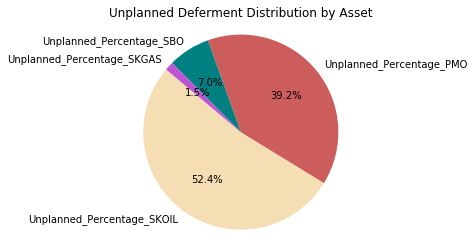

In [35]:
# Visualisation 3.1 Un_Planned
labels = 'Unplanned_Percentage_SKOIL', 'Unplanned_Percentage_PMO', 'Unplanned_Percentage_SBO', 'Unplanned_Percentage_SKGAS'
sizes = [6087/11648*100, 4559/11648*100, 809/11648*100,169/11648*100]
colors = ['wheat', 'indianred', 'teal', 'mediumorchid']

# Plot
plt.pie(sizes, explode=None, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=False, startangle=140)

plt.axis('equal')
plt.title("Unplanned Deferment Distribution by Asset") 
plt.show()

#Option to save image
#plt.savefig("image2.png")

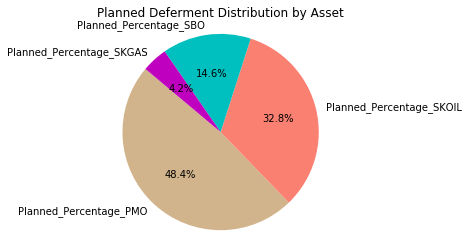

In [36]:
# Visualisation 3.2 Planned
labels = 'Planned_Percentage_PMO', 'Planned_Percentage_SKOIL', 'Planned_Percentage_SBO', 'Planned_Percentage_SKGAS'
sizes = [4425/9180*100, 3002/9180*100, 1338/9180*100, 387/9180*100]
colors = ['tan', 'salmon', 'c', 'm']

# Plot
plt.pie(sizes, explode=None, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=False, startangle=140)

plt.axis('equal')
plt.title("Planned Deferment Distribution by Asset") 
plt.show()

#Option to save image
#plt.savefig("image2.png")

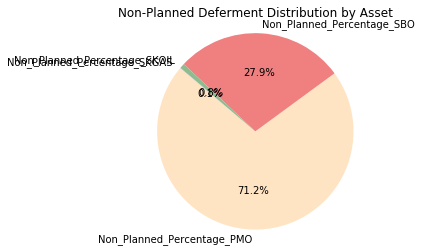

In [37]:
# Visualisation 3.3 Non-Planned
labels = 'Non_Planned_Percentage_PMO', 'Non_Planned_Percentage_SBO', 'Non_Planned_Percentage_SKOIL', 'Non_Planned_Percentage_SKGAS'
sizes = [2062/2145*100, 809/2145*100, 24/2145*100, 2/2145*100]
colors = ['bisque', 'lightcoral', 'darkseagreen', 'thistle']

# Plot
plt.pie(sizes, explode=None, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=False, startangle=140)

plt.axis('equal')
plt.title("Non-Planned Deferment Distribution by Asset") 
plt.show()

#Option to save image
#plt.savefig("image2.png")

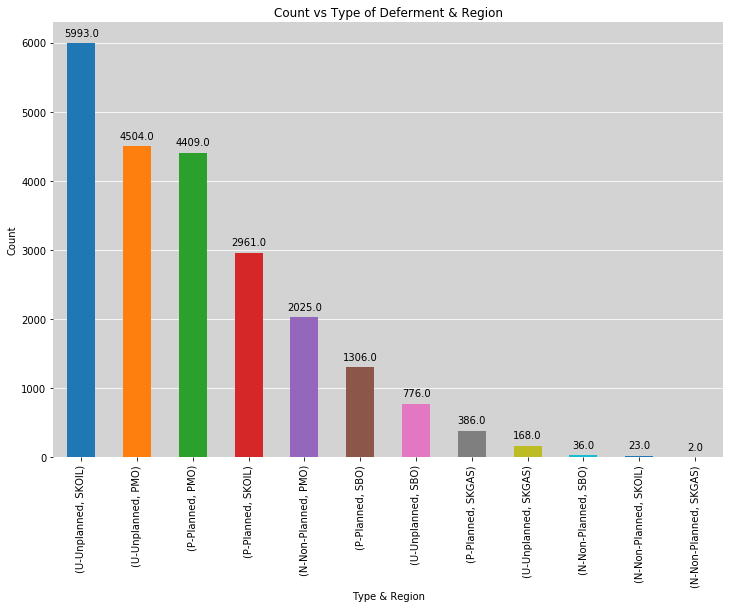

In [38]:
# Visualisation 3

plt.figure(figsize=(12, 8))
ax = event_asset.plot(kind='bar')
ax.set_title('Count vs Type of Deferment & Region')
ax.set_xlabel('Type & Region')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True)

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image3.png")

#### 4.6 Group by Type of Deferment at Field Level and check occurence (Top 10)

In [39]:
# Group by TYPE & OP_SUB_AREA_CODE - i.e. number of events per OP_SUB_AREA_CODE and print top 10

event_field = filtered_asset.groupby(by = ['TYPE', 'OP_SUB_AREA_CODE']).count()['CODE'].nlargest(10)
event_field

TYPE           OP_SUB_AREA_CODE
U-Unplanned    DULG                2712
               BOKR                2146
P-Planned      DULG                1621
U-Unplanned    ANSI                 818
P-Planned      ANSI                 740
N-Non-Planned  ANSI                 710
P-Planned      BOKR                 699
U-Unplanned    BRNA                 696
               BARM                 686
N-Non-Planned  DULG                 683
Name: CODE, dtype: int64

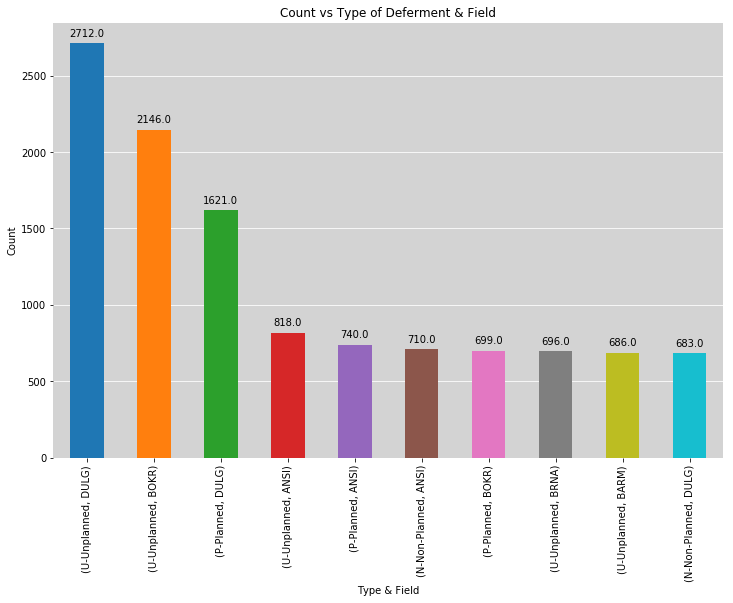

In [40]:
# Visualisation 4

plt.figure(figsize=(12, 8))
ax = event_field.plot(kind='bar')
ax.set_title('Count vs Type of Deferment & Field')
ax.set_xlabel('Type & Field')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True)

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.7 Group by Type of Deferment by Primary Reason and check occurence (Top 10)

In [45]:
# Group by PRIMARY_SECONDARY reason and count

event_reason = filtered_asset.groupby(by = ['TYPE', 'PRIMARY_SECONDARY']).count()['CODE'].nlargest(10)
event_reason

TYPE           PRIMARY_SECONDARY                    
U-Unplanned    CP - Well Quit (Causes Investigation)    2797
P-Planned      EC - CDFT                                1541
               EB - Bottom hole survey                  1194
U-Unplanned    BO - SCSSV system failure                 705
P-Planned      BC - CDFT                                 693
U-Unplanned    AG - Well Quit (Causes Investigation)     636
               CM - Optimisation                         615
               AD - Others                               459
               CI - Gas lift design error/robbing        451
N-Non-Planned  AD - Others                               449
Name: CODE, dtype: int64

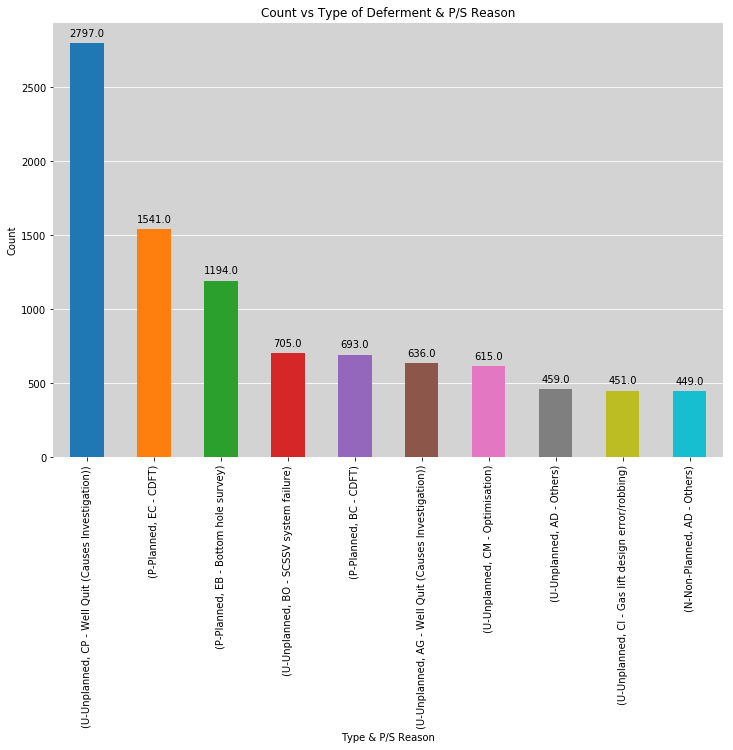

In [46]:
# Visualisation 5

plt.figure(figsize=(12, 8))
ax = event_reason.plot(kind='bar')
ax.set_title('Count vs Type of Deferment & P/S Reason')
ax.set_xlabel('Type & P/S Reason')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True)

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.7 Check total occurence at Asset Level for each year

In [47]:
# Count how many rows for each OP_AREA_CODE and for which type and by year

event_asset_year = filtered_asset.groupby(by = ['OP_AREA_CODE', 'year']).count()['CODE'].nlargest(16)
event_asset_year

OP_AREA_CODE  year  
PMO           2017.0    3332
              2019.0    2936
              2018.0    2553
SKOIL         2019.0    2453
              2018.0    2392
              2017.0    2178
PMO           2016.0    2117
SKOIL         2016.0    1954
SBO           2017.0     672
              2016.0     632
              2018.0     450
              2019.0     364
SKGAS         2019.0     163
              2018.0     158
              2017.0     144
              2016.0      91
Name: CODE, dtype: int64

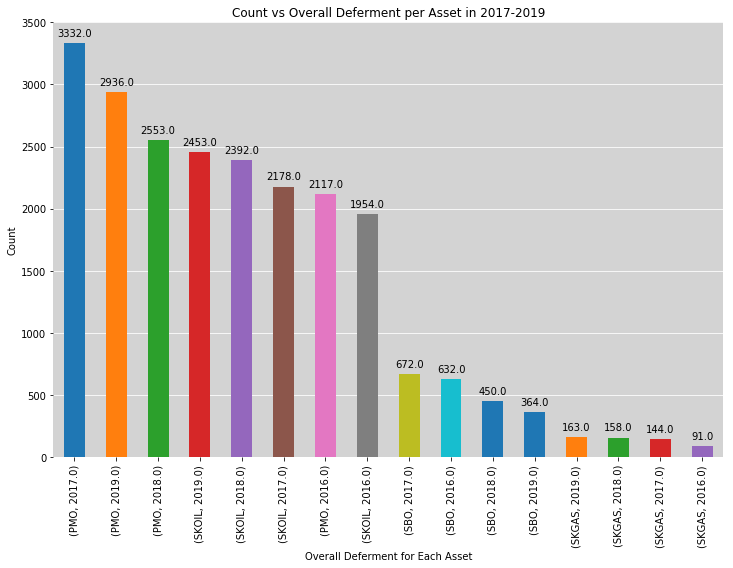

In [48]:
# Visualisation 6

plt.figure(figsize=(12, 8))
ax = event_asset_year.plot(kind='bar')
ax.set_title('Count vs Overall Deferment per Asset in 2017-2019')
ax.set_xlabel('Overall Deferment for Each Asset')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True)

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.8 Check total occurence at Field Level for each year (Top 10)

In [49]:
# Count how many rows for each OP_AREA_CODE and for which type and by year

event_field_year = filtered_asset.groupby(by = ['OP_SUB_AREA_CODE', 'year']).count()['CODE'].nlargest(10)
event_field_year

OP_SUB_AREA_CODE  year  
DULG              2017.0    2281
                  2019.0    1175
BOKR              2019.0     846
DULG              2016.0     833
BOKR              2018.0     821
ANSI              2018.0     804
DULG              2018.0     727
BOKR              2017.0     603
ANSI              2016.0     588
BOKR              2016.0     578
Name: CODE, dtype: int64

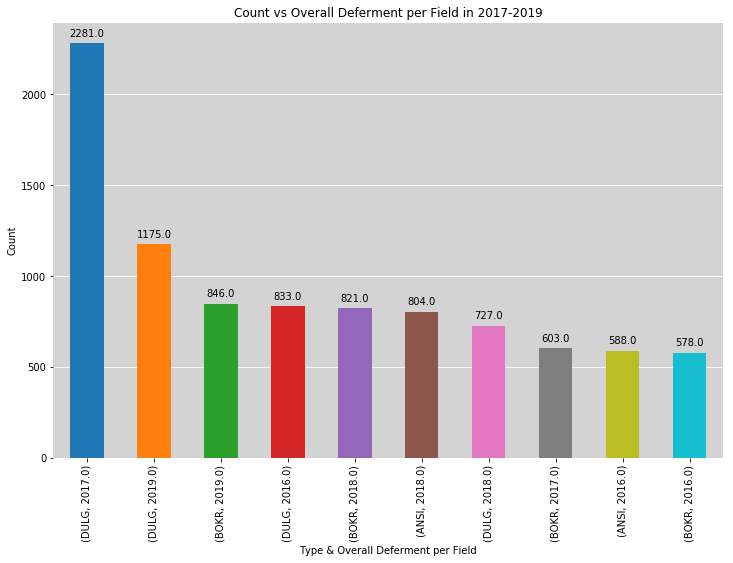

In [50]:
# Visualisation 7

plt.figure(figsize=(12, 8))
ax = event_field_year.plot(kind='bar')
ax.set_title('Count vs Overall Deferment per Field in 2017-2019')
ax.set_xlabel('Type & Overall Deferment per Field')
ax.set_ylabel('Count')
ax.set_facecolor('lightgrey')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(axis='y',color='white', which='major',zorder=0)
ax.set_axisbelow(True)

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.9 Count Loss of Oppurtunity to Flow (Oil) due to Deferment for each year

In [51]:
# Count OIL_EVENT_LOSS_BBLS by year

oil_lost_year = filtered_asset.groupby('year')['OIL_EVENT_LOSS_BBLS'].sum().nlargest(4)
oil_lost_year

year
2018.0    8.379056e+06
2019.0    6.601637e+06
2017.0    5.296372e+06
2016.0    3.706717e+06
Name: OIL_EVENT_LOSS_BBLS, dtype: float64

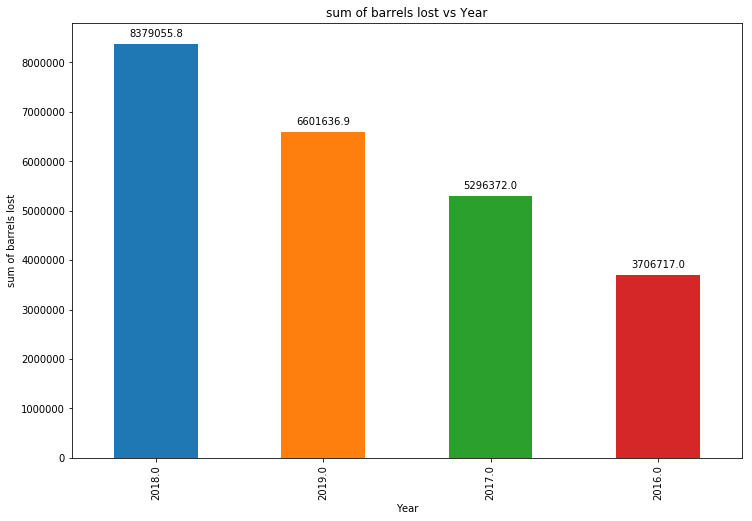

In [52]:
# Visualisation 7

plt.figure(figsize=(12, 8))
ax = oil_lost_year.plot(kind='bar')
ax.set_title('sum of barrels lost vs Year')
ax.set_xlabel('Year')
ax.set_ylabel('sum of barrels lost')

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.10 Count Loss of Oppurtunity to Flow (Gas) due to Deferment for each year

In [53]:
# Count GAS_EVENT_LOSS_BBLS by year

gas_lost_year = filtered_asset.groupby('year')['GAS_EVENT_LOSS_SCF'].sum().nlargest(4)
gas_lost_year

year
2019.0    2.586261e+11
2018.0    1.224682e+11
2017.0    6.343145e+10
2016.0    6.064193e+10
Name: GAS_EVENT_LOSS_SCF, dtype: float64

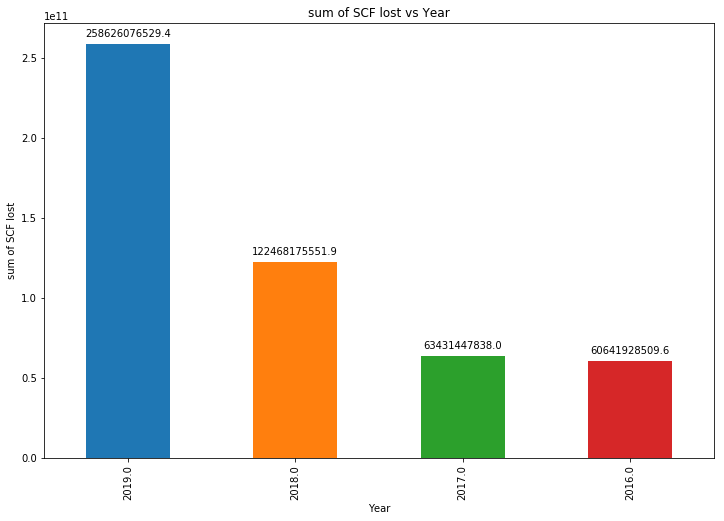

In [54]:
# Visualisation 8

plt.figure(figsize=(12, 8))
ax = gas_lost_year.plot(kind='bar')
ax.set_title('sum of SCF lost vs Year')
ax.set_xlabel('Year')
ax.set_ylabel('sum of SCF lost')

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

#### 4.11 Count Loss of Oppurtunity to Flow (Condy) due to Deferment for each year

In [55]:
# Count COND_EVENT_LOSS_BBLS by year

condy_lost_year = filtered_asset.groupby('year')['COND_EVENT_LOSS_BBLS'].sum().nlargest(4)
condy_lost_year

year
2019.0    3.790185e+06
2018.0    1.877756e+06
2017.0    7.824604e+05
2016.0    4.024463e+05
Name: COND_EVENT_LOSS_BBLS, dtype: float64

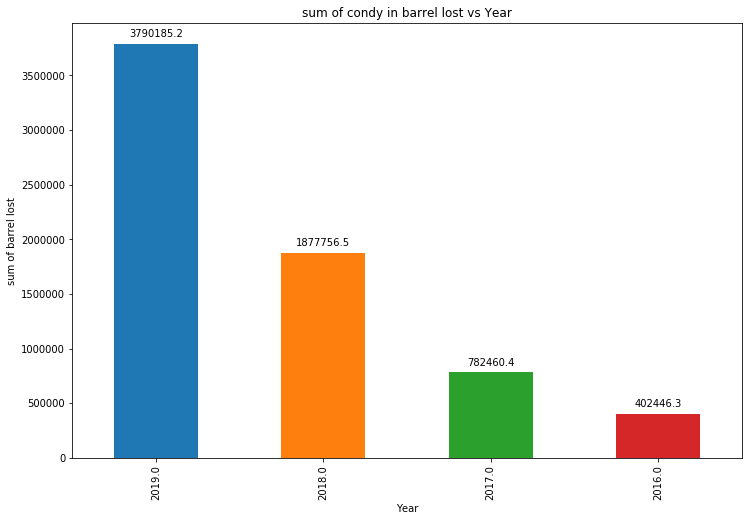

In [56]:
# Visualisation 9

plt.figure(figsize=(12, 8))
ax = condy_lost_year.plot(kind='bar')
ax.set_title('sum of condy in barrel lost vs Year')
ax.set_xlabel('Year')
ax.set_ylabel('sum of barrel lost')

def add_value_labels(ax, spacing=5):
    # For each bar: Place a label
    for rect in ax.patches:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = spacing
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        label = "{:.1f}".format(y_value)

        # Create annotation
        ax.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va)                      # Vertically align label differently for
                                        # positive and negative values.


# Call the function above. All the magic happens there.
add_value_labels(ax)

#Option to save image
#plt.savefig("image.png")

In [42]:
# INTERMEDIATE LEVEL OF ANALYSIS

# Check recurrence of entry from CODE (failure occurs more than one time) & retrieve how many and when
# e.g. DULG-A015-SS, 2, 2015, 2016

In [7]:
cdf_final = cdf[(cdf["CATEGORY"] == "W-Well") & (cdf["OP_AREA_CODE"].isin(["SKOIL", "PMO", "SBO", "SKGAS"])) & (cdf["year"]<2020)]
cdf_final.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0
15,PMO,PULI,PULI-A001S01-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,150.573658,1.800002e+05,NaN,131.751951,1.575002e+05,NaN,NaN,NaN,NaN,2016.0
16,PMO,PULI,PULI-A004-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,99.129740,2.000002e+05,NaN,86.738523,1.750002e+05,NaN,NaN,NaN,NaN,2016.0


In [8]:
cdf_final.tail()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year
118908,PMO,DULG,DULG-B022-SS,2019-12-30,2019-12-31,U-Unplanned,W-Well,CI - Gas lift design error/robbing,165.378001,4.179142e+05,NaN,130.924251,330848.70980,NaN,NaN,NaN,Intermittent flow suspected due to gas robbing,2019.0
118909,PMO,DULG,DULG-A007-TS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),110.263250,3.020000e+05,NaN,4.594302,12583.33333,NaN,NaN,NaN,Well quit,2019.0
118939,SKOIL,LTGW,LTGW-B030S01-SS,2019-12-30,2019-12-30,U-Unplanned,W-Well,CP - Well Quit (Causes Investigation),34.429029,3.700000e+04,NaN,10.041800,10791.66667,NaN,NaN,NaN,Well found quit upon arrival.,2019.0
118977,SKOIL,TMNA,TMNA-W069-TS,2019-12-30,2019-12-30,P-Planned,W-Well,EP - Zone Change,591.055291,2.000000e+05,NaN,172.391127,58333.33333,NaN,NaN,NaN,NaN,2019.0
118988,PMO,DYNG,DYNG-C002-LS,2019-12-30,2019-12-30,P-Planned,W-Well,BY - Xmas tree accessories damage or leak/faul...,NaN,3.082000e+06,9.189,NaN,267179.83830,0.0,NaN,NaN,NaN,2019.0


In [9]:
cdf_final["Weekday"] = [dt.weekday_name for dt in cdf_final["DAYTIME"]]
cdf_final["Month"] = [dt.month_name() for dt in cdf_final["DAYTIME"]]
cdf_final["Quarter"] = [dt.quarter for dt in cdf_final["DAYTIME"]]
cdf_final["DayOfYear"] = [dt.dayofyear for dt in cdf_final["DAYTIME"]]

In [10]:
cdf_final["Deferment_Days"] = ((cdf_final["END_DATE"] - cdf_final["DAYTIME"]) + datetime.timedelta(1))

cdf_final = cdf_final[cdf_final["Deferment_Days"] > datetime.timedelta(0)]

cdf_final["Deferment_Days_Int"] = [td.days for td in cdf_final["Deferment_Days"]]

cdf_final.head()

,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,DAYTIME,END_DATE,TYPE,CATEGORY,PRIMARY_SECONDARY,OIL_POTENTIAL_BBLSPERDAY,GAS_POTENTIAL_SCFPERDAY,COND_POTENTIAL_BBLSPERDAY,OIL_EVENT_LOSS_BBLS,GAS_EVENT_LOSS_SCF,COND_EVENT_LOSS_BBLS,WATER_INJ_EVENT_LOSS_BBLS,GAS_INJ_EVENT_LOSS_SCF,COMMENTS,year,Weekday,Month,Quarter,DayOfYear,Deferment_Days,Deferment_Days_Int
1,PMO,DULG,DULG-A015-SS,2016-01-01,2016-01-01,N-Non-Planned,W-Well,BB - Casing and/or cement leaks,559.573560,8.464934e+05,NaN,209.840085,3.174350e+05,NaN,NaN,NaN,NaN,2016.0,Friday,January,1,1,1 days,1
2,PMO,ANSI,ANSI-B014-LS,2016-01-01,2016-04-05,U-Unplanned,W-Well,NaN,84.258308,9.771577e+04,NaN,8011.560786,9.291142e+06,NaN,NaN,NaN,NaN,2016.0,Friday,January,1,1,96 days,96
4,PMO,BEKK,BEKK-A006-TS,2016-01-01,2016-01-20,U-Unplanned,W-Well,BE - Corrosion/Erosion,660.387000,9.098557e+06,NaN,12822.514250,1.766636e+08,NaN,NaN,NaN,NaN,2016.0,Friday,January,1,1,20 days,20
15,PMO,PULI,PULI-A001S01-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,150.573658,1.800002e+05,NaN,131.751951,1.575002e+05,NaN,NaN,NaN,NaN,2016.0,Friday,January,1,1,2 days,2
16,PMO,PULI,PULI-A004-TS,2016-01-01,2016-01-02,N-Non-Planned,W-Well,NaN,99.129740,2.000002e+05,NaN,86.738523,1.750002e+05,NaN,NaN,NaN,NaN,2016.0,Friday,January,1,1,2 days,2


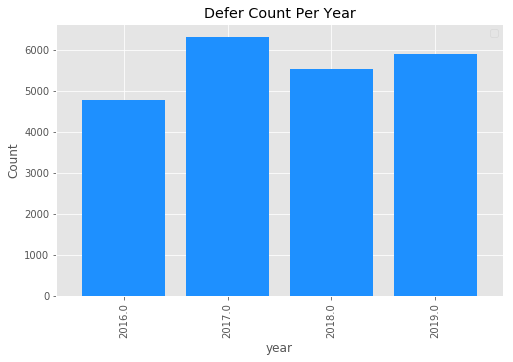

In [11]:
with plt.style.context(("ggplot")):
    cdf_final.groupby(by="year").count()[["CODE"]]\
                                .rename(columns={"CODE":"Count"})\
                                .plot.bar(color="dodgerblue", 
                                          width=0.8, 
                                          figsize=(8,5), 
                                          title="Defer Count Per Year")
    plt.legend([],[])
    plt.ylabel("Count")

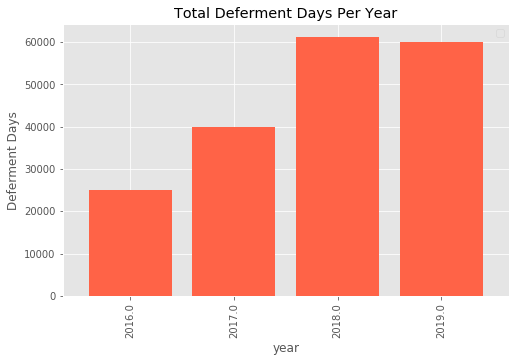

In [12]:
with plt.style.context(("ggplot")):
    cdf_final.groupby(by="year").sum()[["Deferment_Days_Int"]]\
                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                .plot.bar(color="tomato", 
                                          width=0.8, 
                                          figsize=(8,5),
                                          title="Total Deferment Days Per Year")
    plt.legend([],[])
    plt.ylabel("Deferment Days")

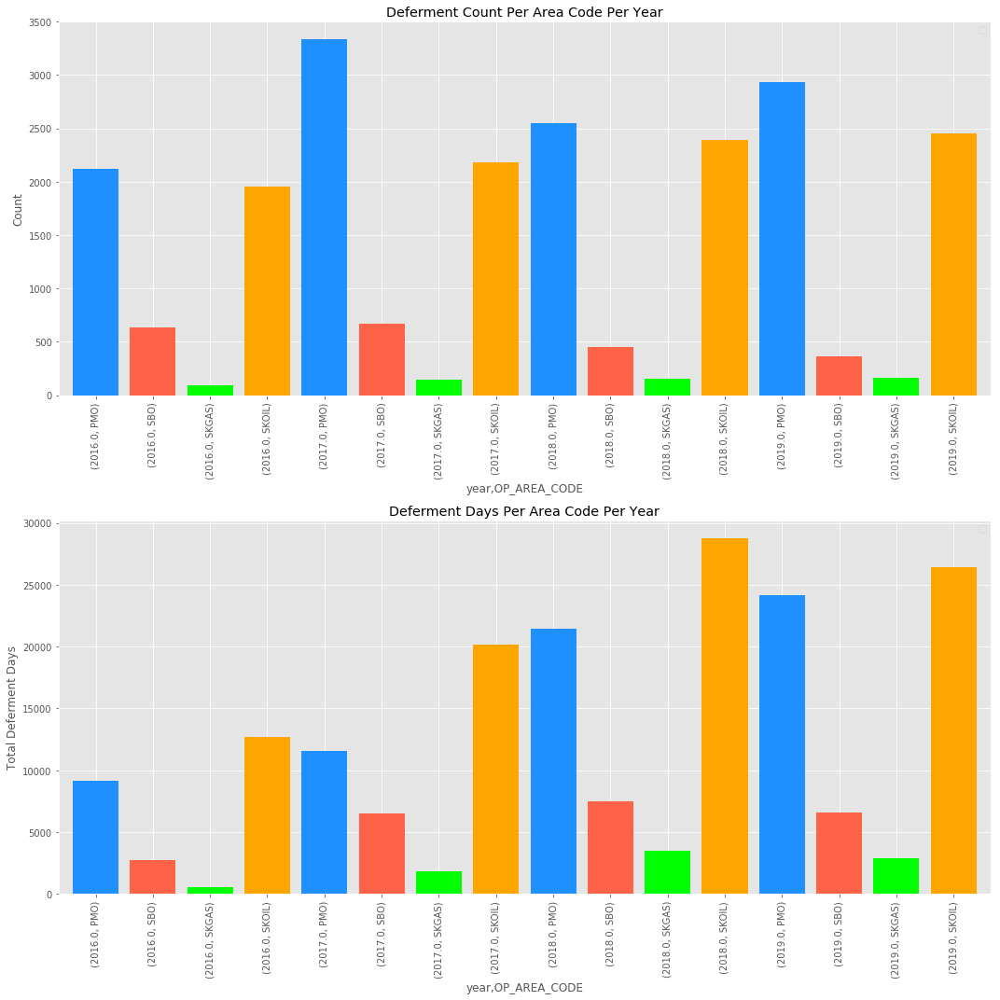

In [13]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,15))
    
    ax1 = fig.add_subplot(2,1,1)
    cdf_final.groupby(by=["year", "OP_AREA_CODE"]).count()[["CODE"]]\
                                .rename(columns={"CODE":"Count"})\
                                .plot.bar(y="Count",
                                          color=["dodgerblue", "tomato", "lime", "orange"], 
                                          width=0.8, 
                                          ax=ax1,
                                          title="Deferment Count Per Area Code Per Year")
    plt.legend([],[])
    plt.ylabel("Count")
    
    ax2 = fig.add_subplot(2,1,2)
    cdf_final.groupby(by=["year", "OP_AREA_CODE"]).sum()[["Deferment_Days_Int"]]\
                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                .plot.bar(y="Total_Deferment_Days",
                                          color=["dodgerblue", "tomato", "lime", "orange"], 
                                          width=0.8, 
                                          ax=ax2, 
                                          title="Deferment Days Per Area Code Per Year")
    plt.legend([],[])
    plt.ylabel("Total Deferment Days")
    
    plt.tight_layout()

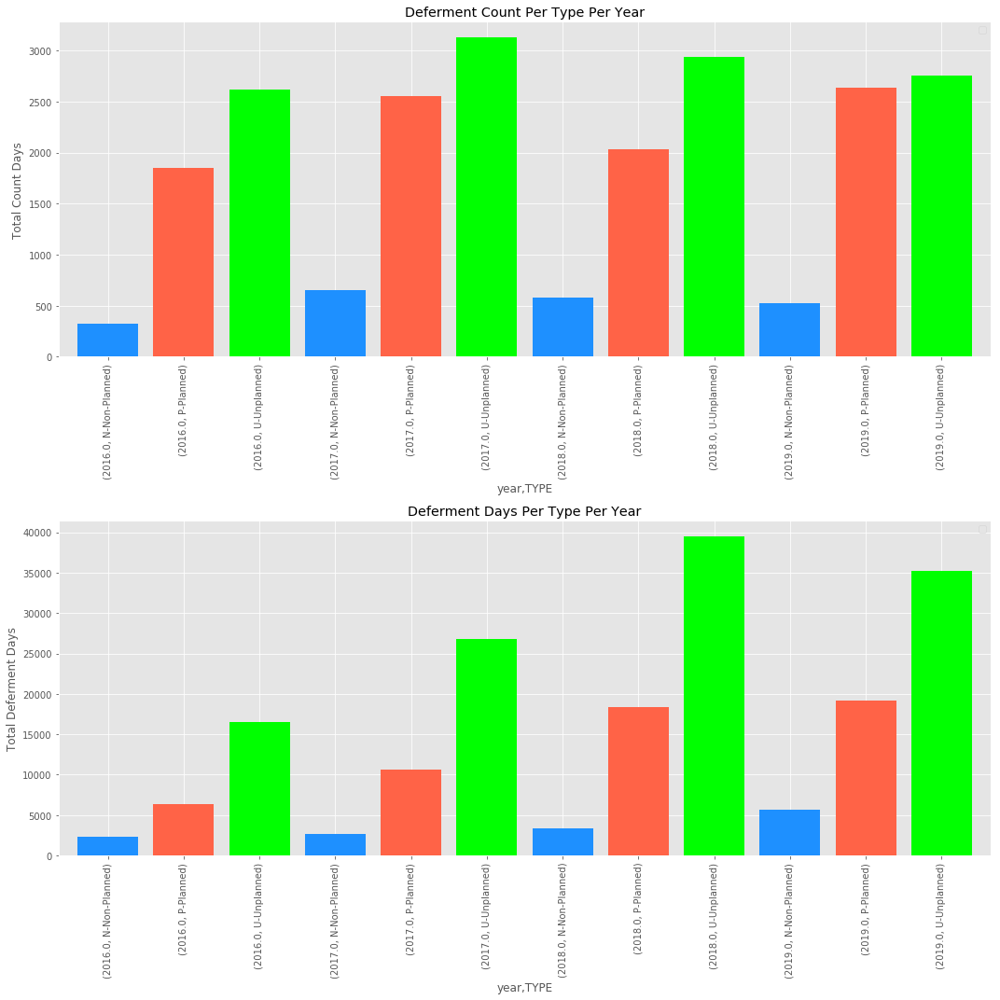

In [14]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,15))
    
    ax1 = fig.add_subplot(2,1,1)
    cdf_final.groupby(by=["year", "TYPE"]).count()[["CODE"]]\
                                .rename(columns={"CODE":"Count"})\
                                .plot.bar(y="Count",
                                          color=["dodgerblue", "tomato", "lime"], 
                                          width=0.8, 
                                          ax=ax1, 
                                          title="Deferment Count Per Type Per Year")
    plt.legend([],[])
    plt.ylabel("Total Count Days")
    
    ax2 = fig.add_subplot(2,1,2)
    cdf_final.groupby(by=["year", "TYPE"]).sum()[["Deferment_Days_Int"]]\
                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                .plot.bar(y="Total_Deferment_Days",
                                          color=["dodgerblue", "tomato", "lime"], 
                                          width=0.8, 
                                          ax=ax2, 
                                          title="Deferment Days Per Type Per Year")
    plt.legend([],[])
    plt.ylabel("Total Deferment Days")
    plt.tight_layout()

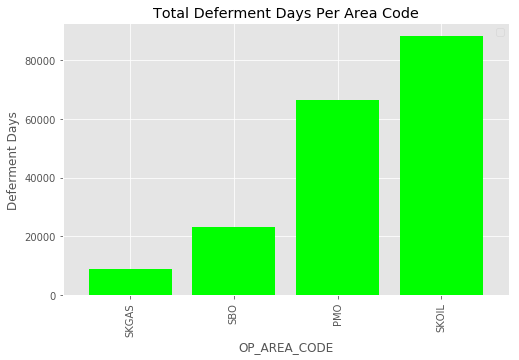

In [16]:
with plt.style.context(("ggplot")):
    cdf_final.groupby(by="OP_AREA_CODE").sum()[["Deferment_Days_Int"]]\
                                        .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                        .sort_values(by="Total_Deferment_Days")\
                                        .plot.bar(color="lime",
                                                  width=0.8, 
                                                  figsize=(8,5),
                                                  title="Total Deferment Days Per Area Code")
    plt.legend([],[])
    plt.ylabel("Deferment Days")

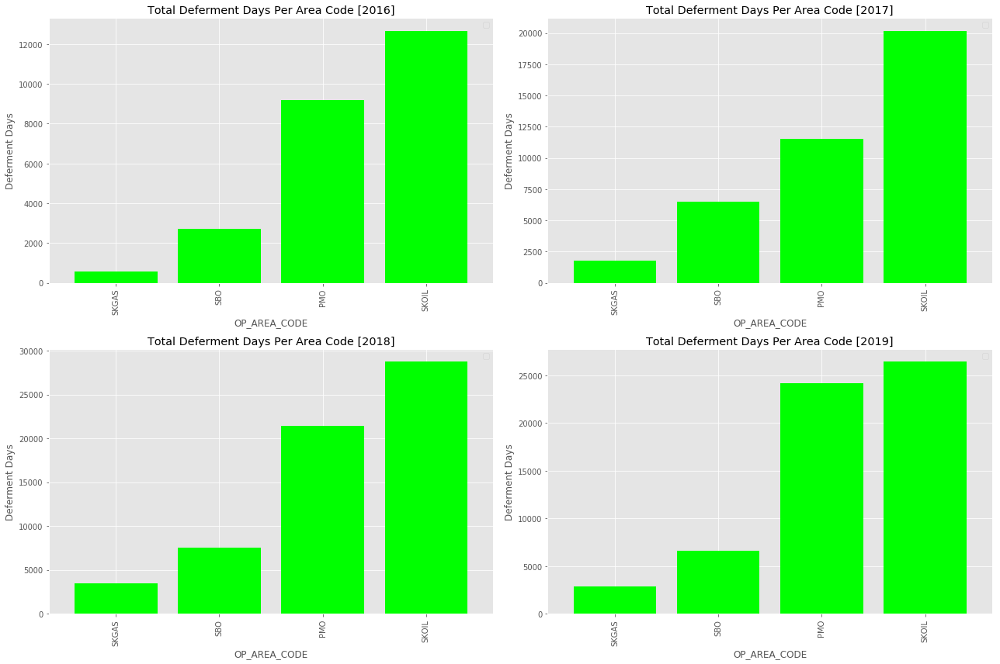

In [17]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(18,12))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="OP_AREA_CODE").sum()[["Deferment_Days_Int"]]\
                                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                                .sort_values(by="Total_Deferment_Days")\
                                                .plot.bar(color="lime", width=0.8, 
                                                            title="Total Deferment Days Per Area Code [%d]"%year, 
                                                            ax=ax)
        plt.legend([],[])
        plt.ylabel("Deferment Days")
    plt.tight_layout()

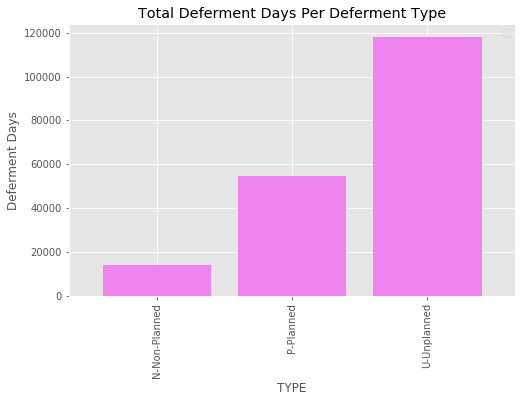

In [18]:
with plt.style.context(("ggplot")):
    cdf_final.groupby(by="TYPE").sum()[["Deferment_Days_Int"]]\
                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                .sort_values(by="Total_Deferment_Days")\
                                .plot.bar(color="violet",
                                          width=0.8,
                                          figsize=(8,5),
                                          title="Total Deferment Days Per Deferment Type")
    plt.legend([],[])
    plt.ylabel("Deferment Days")

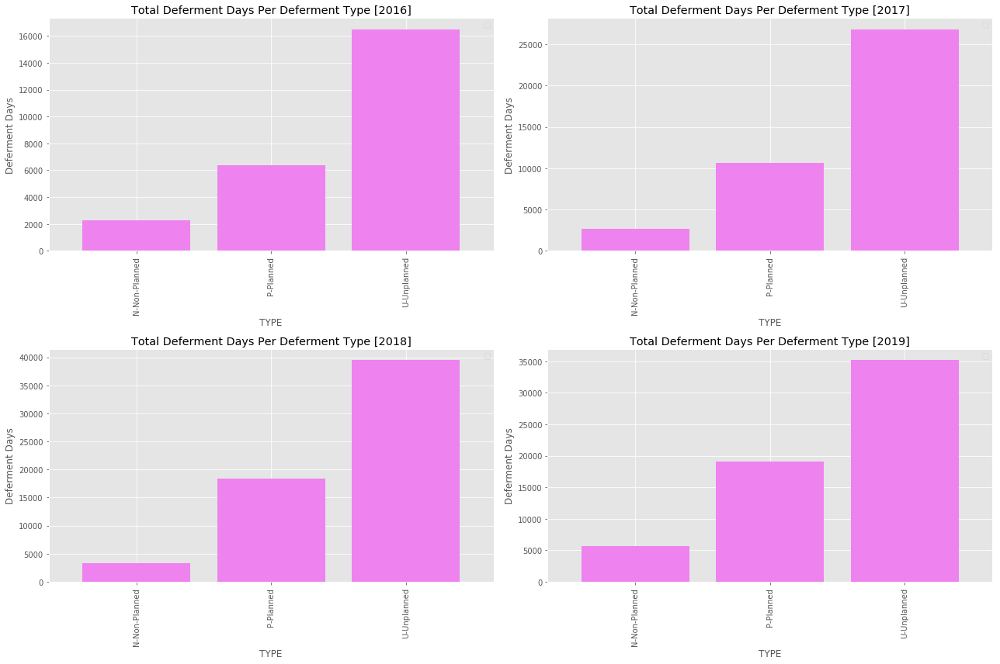

In [19]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(18,12))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="TYPE").sum()[["Deferment_Days_Int"]]\
                                                             .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                                             .sort_values(by="Total_Deferment_Days")\
                                                             .plot.bar(color="violet", 
                                                                       width=0.8,
                                                                       title="Total Deferment Days Per Deferment Type [%d]"%year, ax=ax)
        plt.legend([],[])
        plt.ylabel("Deferment Days")
    plt.tight_layout()

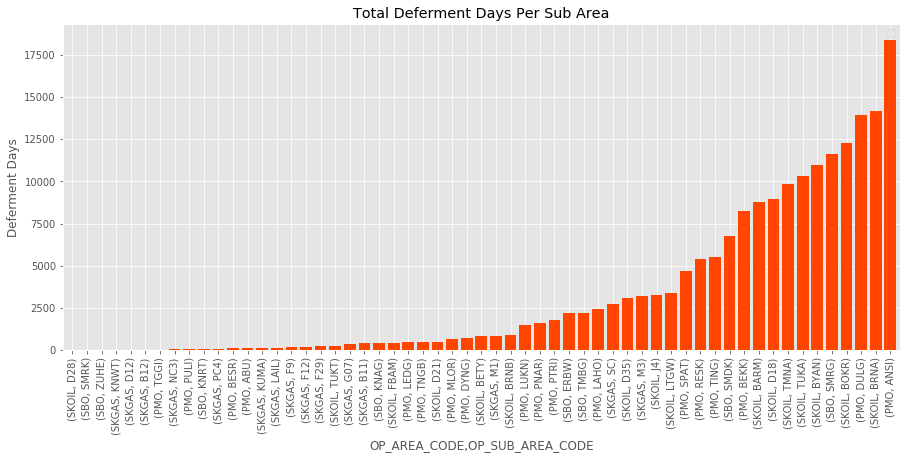

In [20]:
with plt.style.context(("ggplot")):
    cdf_final.groupby(by=["OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["Deferment_Days_Int"]]\
                                            .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                            .sort_values(by="Total_Deferment_Days")\
                                            .plot.bar(color="orangered", 
                                                      width=0.8, 
                                                      figsize=(15,6), 
                                                      title="Total Deferment Days Per Sub Area")
    plt.legend([],[])
    plt.ylabel("Deferment Days")

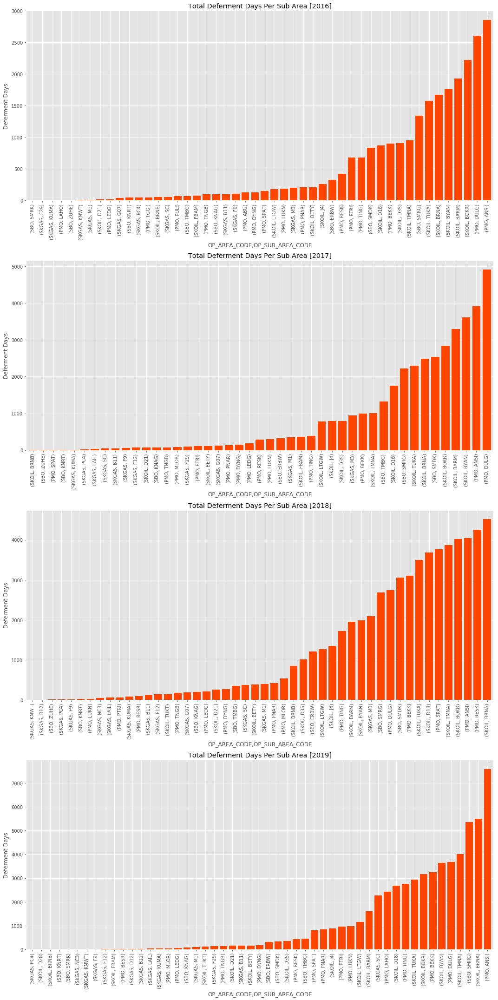

In [21]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15, 30))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(4,1,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by=["OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["Deferment_Days_Int"]]\
                                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                                .sort_values(by="Total_Deferment_Days")\
                                                .plot.bar(color="orangered", 
                                                          width=0.8, 
                                                          ax=ax, 
                                                          title="Total Deferment Days Per Sub Area [%d]"%year)
        plt.legend([],[])
        plt.ylabel("Deferment Days")
    plt.tight_layout()

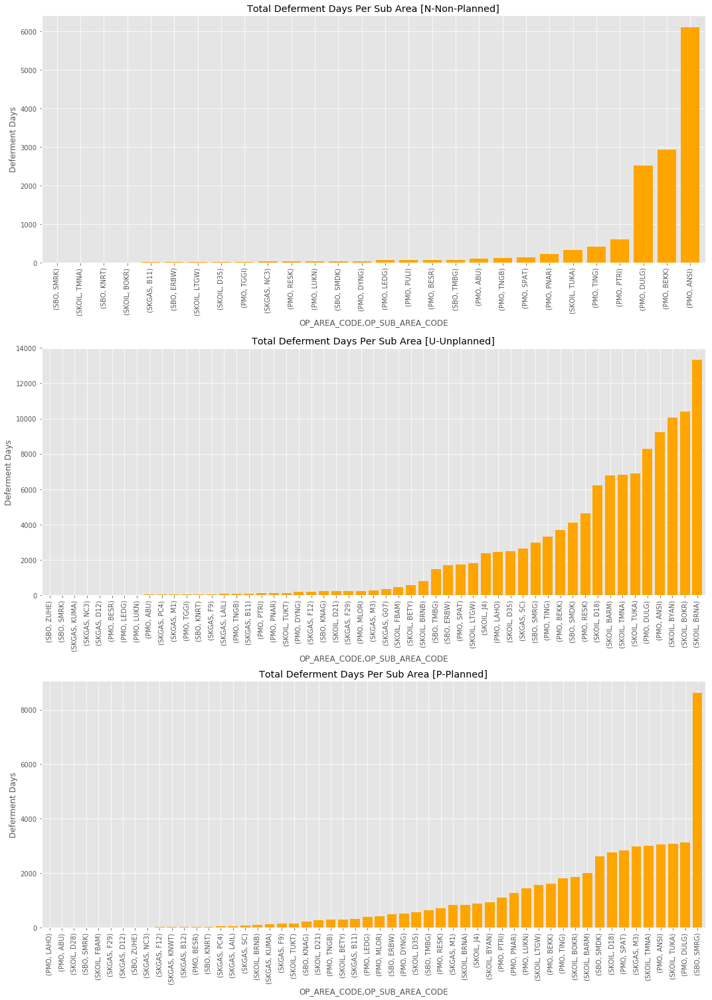

In [22]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15, 21))
    
    for i, typ in enumerate(cdf_final["TYPE"].unique()):
        ax = fig.add_subplot(3,1,i+1)
        cdf_final[cdf_final["TYPE"]==typ].groupby(by=["OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["Deferment_Days_Int"]]\
                                                .rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
                                                .sort_values(by="Total_Deferment_Days")\
                                                .plot.bar(color="orange", 
                                                          width=0.8, 
                                                          ax=ax, 
                                                          title="Total Deferment Days Per Sub Area [%s]"%typ)
        plt.legend([],[])
        plt.ylabel("Deferment Days")
    plt.tight_layout()

In [23]:
print("Minimum Deferment Period              : ",cdf_final["Deferment_Days"].min())
print("Maximum Deferment Period              : ",cdf_final["Deferment_Days"].max())
print("Average Deferment Period              : ",cdf_final["Deferment_Days"].mean())
print("Median Deferment Period               : ",cdf_final["Deferment_Days"].median())
print("Stadard Deviation of Deferment Period : ",cdf_final["Deferment_Days"].std())
print("Variance of Deferment Period          : ",cdf_final["Deferment_Days"].var())

Minimum Deferment Period              :  1 days 00:00:00
Maximum Deferment Period              :  1381 days 00:00:00
Average Deferment Period              :  8 days 06:04:03.835495
Median Deferment Period               :  1 days 00:00:00
Stadard Deviation of Deferment Period :  47 days 16:07:32.855331
Variance of Deferment Period          :  1.696494884387436e+31


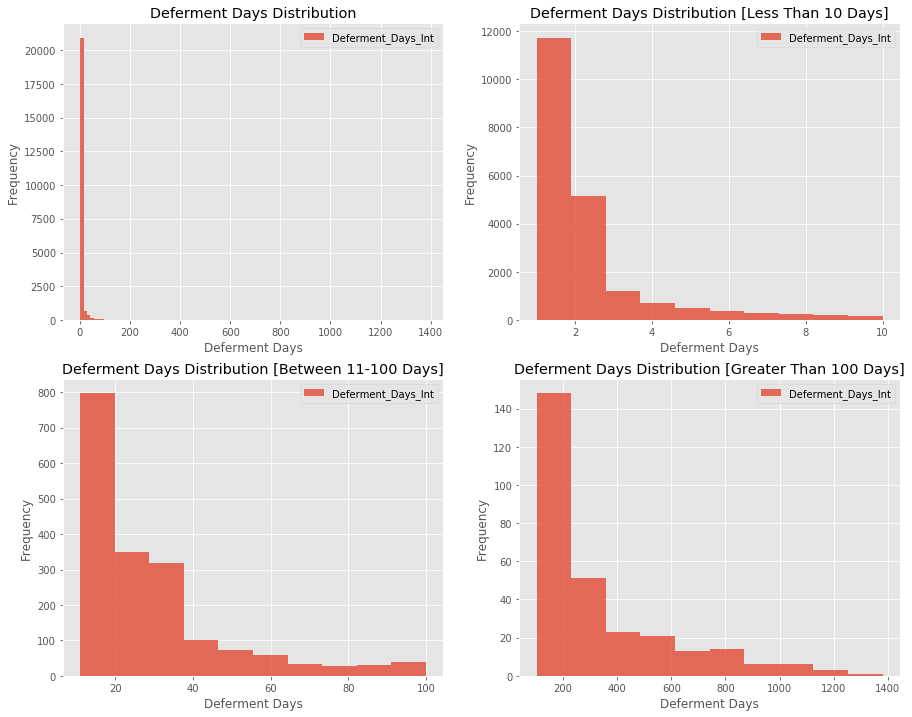

In [24]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,12))
    ax1 = fig.add_subplot(221)
    cdf_final[["Deferment_Days_Int"]].plot.hist(alpha=0.8, bins=100, title="Deferment Days Distribution", ax=ax1)
    plt.xlabel("Deferment Days")
    
    ax2 = fig.add_subplot(222)
    cdf_final[["Deferment_Days_Int"]][cdf_final[["Deferment_Days_Int"]] <=10].plot.hist( alpha=0.8, title="Deferment Days Distribution [Less Than 10 Days]", ax=ax2)
    plt.xlabel("Deferment Days")
    
    ax3 = fig.add_subplot(223)
    cdf_final[["Deferment_Days_Int"]][(cdf_final[["Deferment_Days_Int"]] >10) & (cdf_final[["Deferment_Days_Int"]] <=100)].plot.hist(alpha=0.8, title="Deferment Days Distribution [Between 11-100 Days]", ax=ax3)
    plt.xlabel("Deferment Days")
    
    ax4 = fig.add_subplot(224)
    cdf_final[["Deferment_Days_Int"]][cdf_final[["Deferment_Days_Int"]] >100].plot.hist(alpha=0.8, title="Deferment Days Distribution [Greater Than 100 Days]", ax=ax4)
    plt.xlabel("Deferment Days")

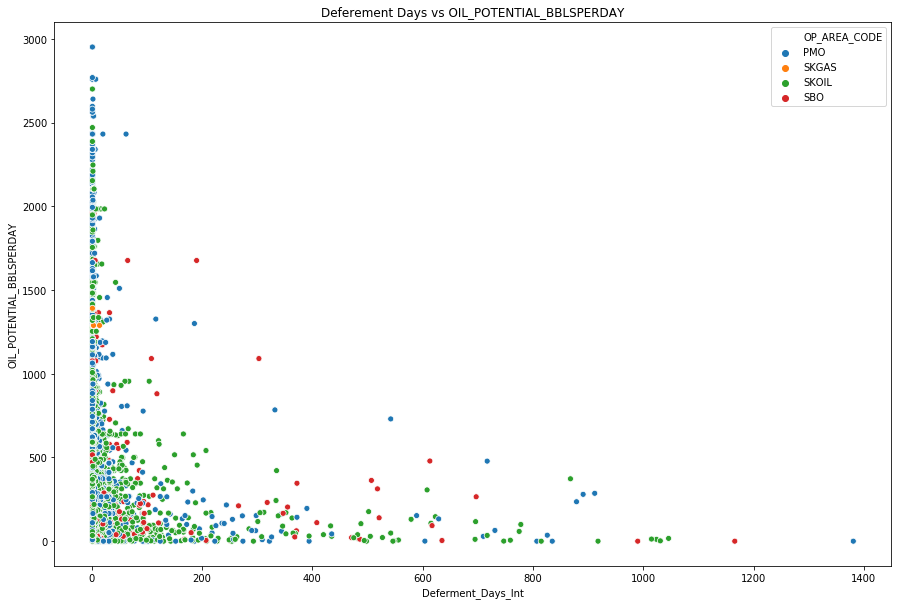

In [25]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, 
                x="Deferment_Days_Int", 
                y="OIL_POTENTIAL_BBLSPERDAY",
                hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs OIL_POTENTIAL_BBLSPERDAY");

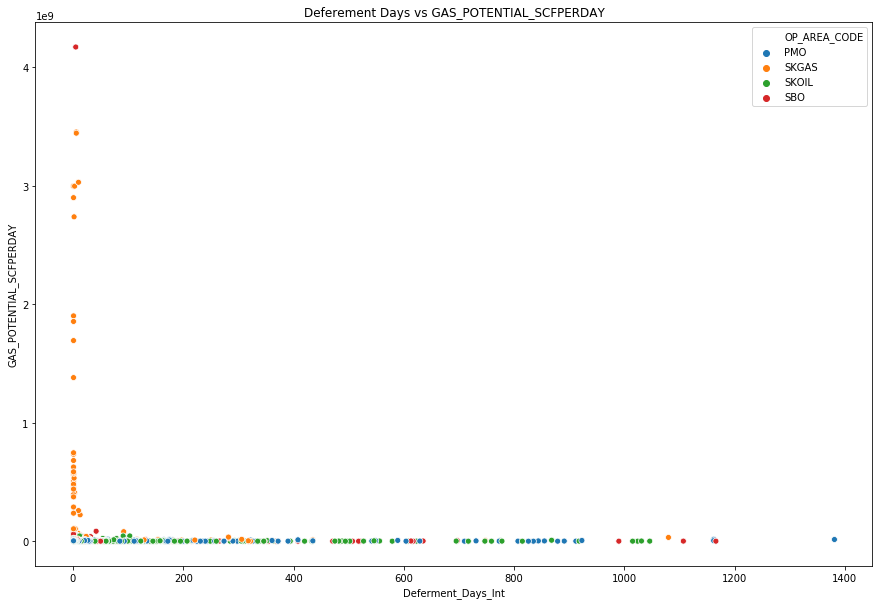

In [26]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, x="Deferment_Days_Int", y="GAS_POTENTIAL_SCFPERDAY", hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs GAS_POTENTIAL_SCFPERDAY");

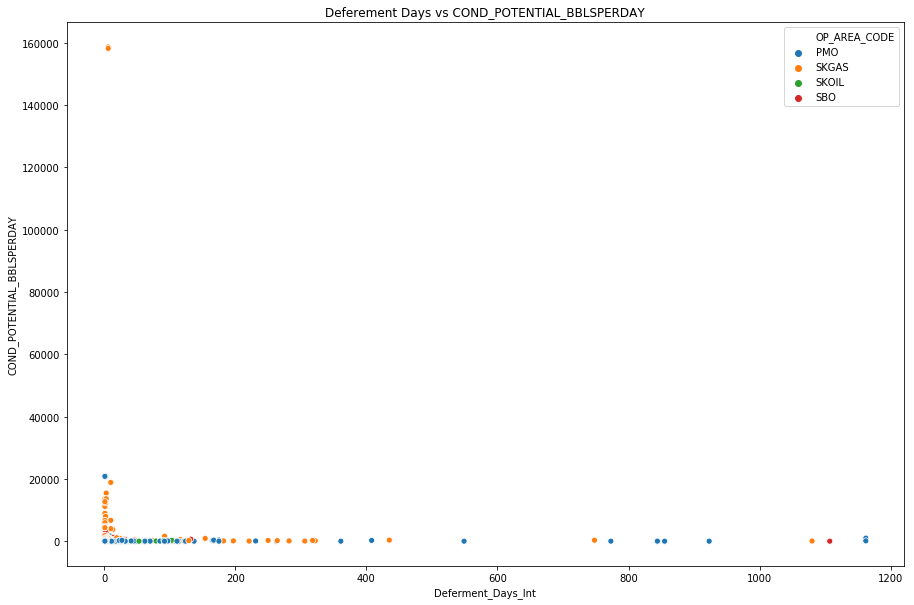

In [27]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, x="Deferment_Days_Int", y="COND_POTENTIAL_BBLSPERDAY", hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs COND_POTENTIAL_BBLSPERDAY");

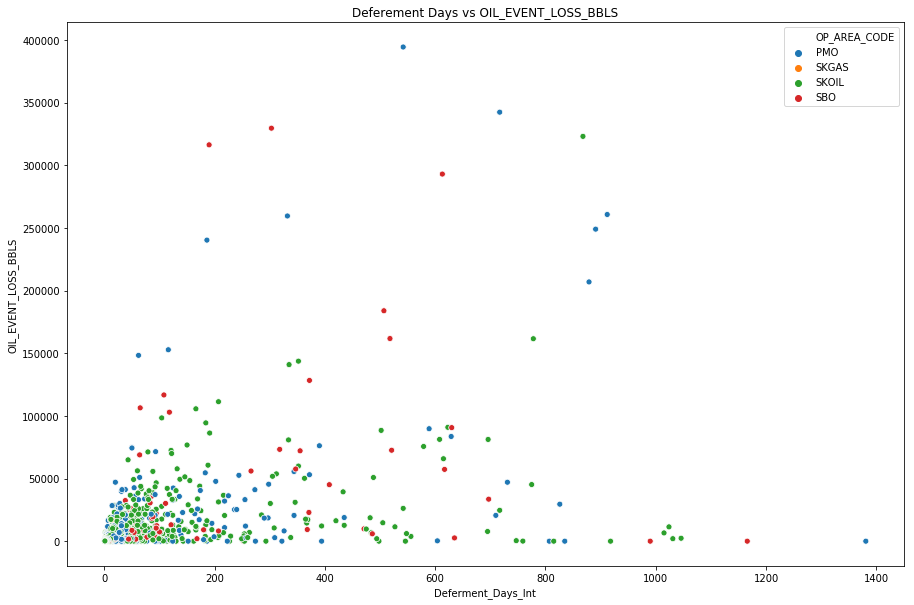

In [28]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, x="Deferment_Days_Int", y="OIL_EVENT_LOSS_BBLS", hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs OIL_EVENT_LOSS_BBLS");

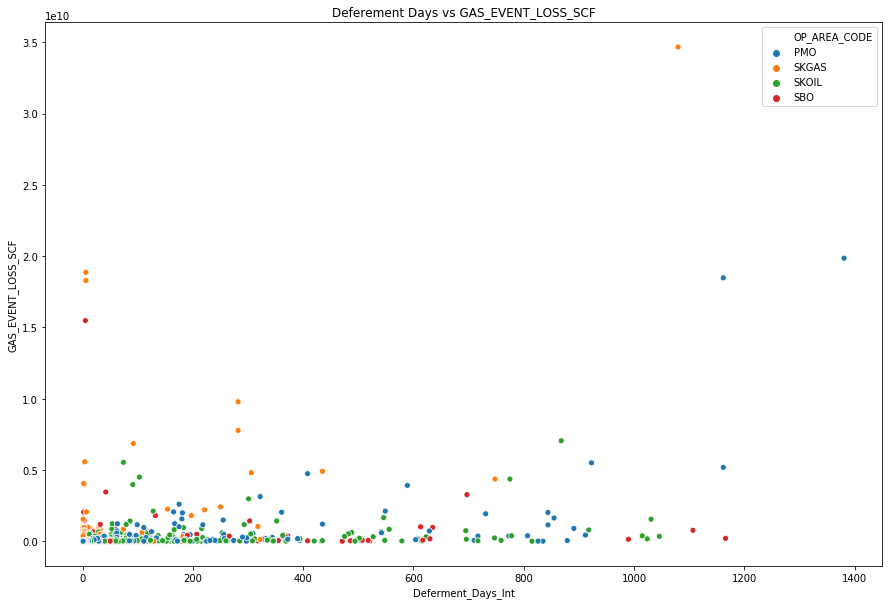

In [29]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, x="Deferment_Days_Int", y="GAS_EVENT_LOSS_SCF", hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs GAS_EVENT_LOSS_SCF");

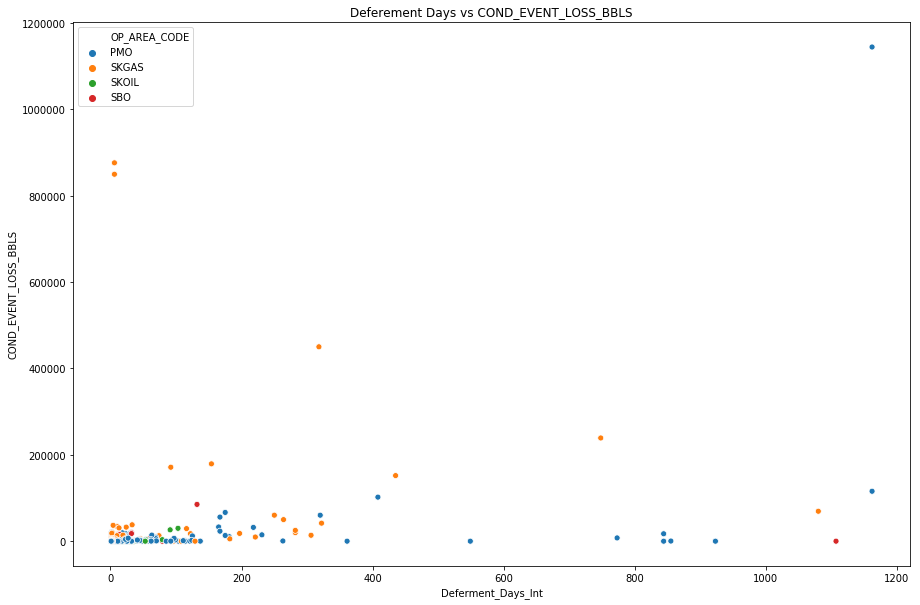

In [30]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.scatterplot(data=cdf_final, x="Deferment_Days_Int", y="COND_EVENT_LOSS_BBLS", hue="OP_AREA_CODE", ax=ax);
plt.title("Deferement Days vs COND_EVENT_LOSS_BBLS");

In [32]:
cdf_final["Total"] = "Total"
area_sub_area_code_def_count = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "CODE"]).count()[["CATEGORY"]].rename(columns={"CATEGORY":"Deferement_Count"})
area_sub_area_code_def_count =area_sub_area_code_def_count.reset_index()
area_sub_area_code_def_count.head()

,Total,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,Deferement_Count
0,Total,PMO,ABU,ABU-A001-TS,7
1,Total,PMO,ABU,ABU-A002-TS,1
2,Total,PMO,ABU,ABU-A004-SS,1
3,Total,PMO,ABU,ABU-A005-TS,6
4,Total,PMO,ABU,ABUK-A002-TS,4


In [33]:
fig = px.sunburst(area_sub_area_code_def_count,
            path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "CODE"],
            values="Deferement_Count", ## It refers to number of deferement
            title="Deferement Count Distribution Per Area, Sub Area & Code Over Four Years",
            height=700)

fig.show()

In [34]:
area_sub_area_code_tot_def_days = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "CODE"]).count()[["Deferment_Days_Int"]].rename(columns={"Deferment_Days_Int":"Total_Deferement_Days"})
area_sub_area_code_tot_def_days =area_sub_area_code_tot_def_days.reset_index()
area_sub_area_code_tot_def_days.head()

,Total,OP_AREA_CODE,OP_SUB_AREA_CODE,CODE,Total_Deferement_Days
0,Total,PMO,ABU,ABU-A001-TS,7
1,Total,PMO,ABU,ABU-A002-TS,1
2,Total,PMO,ABU,ABU-A004-SS,1
3,Total,PMO,ABU,ABU-A005-TS,6
4,Total,PMO,ABU,ABUK-A002-TS,4


In [35]:
fig = px.sunburst(area_sub_area_code_tot_def_days,
            path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "CODE"],
            values="Total_Deferement_Days", ## It refers to total deferment days per category
            title="Deferement Days Distribution Per Area ,Sub Area & Code Over Four Years",
            height=700)

fig.show()

In [36]:
area_sub_area_type_def_count = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "TYPE"]).count()[["CATEGORY"]].rename(columns={"CATEGORY":"Deferement_Count"})
area_sub_area_type_def_count =area_sub_area_type_def_count.reset_index()
area_sub_area_type_def_count.head()

,Total,OP_AREA_CODE,OP_SUB_AREA_CODE,TYPE,Deferement_Count
0,Total,PMO,ABU,N-Non-Planned,7
1,Total,PMO,ABU,P-Planned,4
2,Total,PMO,ABU,U-Unplanned,8
3,Total,PMO,ANSI,N-Non-Planned,710
4,Total,PMO,ANSI,P-Planned,740


In [37]:
fig = px.sunburst(area_sub_area_type_def_count,
            path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "TYPE"],
            values="Deferement_Count", ## It refers to deferment count per category
            title="Deferement Days Distribution Per Area, Sub Area & Type Over Four Years",
            height=700)

fig.show()

In [38]:
area_sub_area_prim_sec_def_count = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "PRIMARY_SECONDARY"]).count()[["CATEGORY"]].rename(columns={"CATEGORY":"Deferement_Count"})
area_sub_area_prim_sec_def_count =area_sub_area_prim_sec_def_count.reset_index()
area_sub_area_prim_sec_def_count.head()

,Total,OP_AREA_CODE,OP_SUB_AREA_CODE,PRIMARY_SECONDARY,Deferement_Count
0,Total,PMO,ABU,EB - Bottom hole survey,4
1,Total,PMO,ANSI,AA - Capacity constraint / Facility limit,15
2,Total,PMO,ANSI,AB - Gas cusping,16
3,Total,PMO,ANSI,AC - Optimisation,8
4,Total,PMO,ANSI,AD - Others,335


In [39]:
fig = px.sunburst(area_sub_area_prim_sec_def_count,
            path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE", "PRIMARY_SECONDARY"],
            values="Deferement_Count", ## It refers to deferment count per category
            title="Deferement Days Distribution Per Area, Sub Area & Primary/Secondary Over Four Years",
            height=700)

fig.show()

In [40]:
cdf_final["Total"] = "Total"
area_sub_area_dist = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).count()[["CODE"]].rename(columns={"CODE":"Deferement_Count"})
area_sub_area_oil_event_loss = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["OIL_EVENT_LOSS_BBLS"]].rename(columns={"OIL_EVENT_LOSS_BBLS":"TOTAL_OIL_EVENT_LOSS_BBLS"})
area_sub_area_gas_event_loss = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["GAS_EVENT_LOSS_SCF"]].rename(columns={"GAS_EVENT_LOSS_SCF":"TOTAL_GAS_EVENT_LOSS_SCF"})
area_sub_area_cond_event_loss = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["COND_EVENT_LOSS_BBLS"]].rename(columns={"COND_EVENT_LOSS_BBLS":"TOTAL_COND_EVENT_LOSS_BBLS"})
area_sub_area_water_inj_event_loss = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["WATER_INJ_EVENT_LOSS_BBLS"]].rename(columns={"WATER_INJ_EVENT_LOSS_BBLS":"TOTAL_WATER_INJ_EVENT_LOSS_BBLS"})
area_sub_area_gas_inj_event_loss = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["GAS_INJ_EVENT_LOSS_SCF"]].rename(columns={"GAS_INJ_EVENT_LOSS_SCF":"TOTAL_GAS_INJ_EVENT_LOSS_SCF"})
area_sub_area_total_def_day = cdf_final.groupby(by=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"]).sum()[["Deferment_Days_Int"]].rename(columns={"Deferment_Days_Int":"Total_Deferement_Days"})

area_sub_area_dist = area_sub_area_dist.join(area_sub_area_oil_event_loss)\
    .join(area_sub_area_gas_event_loss)\
    .join(area_sub_area_cond_event_loss)\
    .join(area_sub_area_water_inj_event_loss)\
    .join(area_sub_area_gas_inj_event_loss)\
    .join(area_sub_area_total_def_day)\

area_sub_area_dist = area_sub_area_dist.reset_index()

area_sub_area_dist.head()

,Total,OP_AREA_CODE,OP_SUB_AREA_CODE,Deferement_Count,TOTAL_OIL_EVENT_LOSS_BBLS,TOTAL_GAS_EVENT_LOSS_SCF,TOTAL_COND_EVENT_LOSS_BBLS,TOTAL_WATER_INJ_EVENT_LOSS_BBLS,TOTAL_GAS_INJ_EVENT_LOSS_SCF,Total_Deferement_Days
0,Total,PMO,ABU,19,3.240805e+03,1.496803e+07,0.000000,0.0,0.0,125
1,Total,PMO,ANSI,2268,2.905005e+06,2.632306e+10,207870.017621,0.0,0.0,18402
2,Total,PMO,BEKK,878,7.446557e+05,2.309542e+10,22156.450414,0.0,0.0,8225
3,Total,PMO,BESR,25,0.000000e+00,1.829074e+09,45583.356250,0.0,0.0,121
4,Total,PMO,DULG,5016,2.447169e+06,4.939979e+09,0.000000,0.0,0.0,13923


In [41]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="Total_Deferement_Days",
                    color_continuous_scale="YlOrRd",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years Color-Encoded By Total Deferment Days",
                    height=700)

fig.show()

In [42]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="TOTAL_OIL_EVENT_LOSS_BBLS",
                    color_continuous_scale="RdBu",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years Color-Encoded By Total Oil Event",
                    height=700)

fig.show()

In [43]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="TOTAL_GAS_EVENT_LOSS_SCF",
                    color_continuous_scale="PiYG",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years Color-Encoded By Total Gas Event",
                    height=700)

fig.show()

In [44]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="TOTAL_COND_EVENT_LOSS_BBLS",
                    color_continuous_scale="PuOr",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years Color-Encoded By Total Cond Event",
                    height=700)

fig.show()

In [45]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="TOTAL_WATER_INJ_EVENT_LOSS_BBLS",
                    color_continuous_scale="RdYlGn",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years Color-Encoded By Total Watern Inj Event",
                    height=700)

fig.show()

In [46]:
fig = px.sunburst(area_sub_area_dist,
                    path=["Total", "OP_AREA_CODE", "OP_SUB_AREA_CODE"],
                    values="Deferement_Count",
                    color="TOTAL_GAS_INJ_EVENT_LOSS_SCF",
                    color_continuous_scale="RdYlBu",
                    title="Deferement Count Distribution Per Area & Sub Area Over Four Years by Total Gas Inj Event",
                    height=700)

fig.show()

In [47]:
print("OP AREA CODE Count Distribution : ", sorted(Counter(cdf_final["OP_AREA_CODE"]).items(), key=lambda x: x[1], reverse=True))

print("\nOP SUB AREA CODE Count Distribution : ", sorted(Counter(cdf_final["OP_SUB_AREA_CODE"]).items(), key=lambda x: x[1], reverse=True))

print("\nDeferment Type Distribution : ", sorted(Counter(cdf_final["TYPE"]).items(), key=lambda x: x[1], reverse=True))

print("\nPRIMARY_SECONDARY Distribution : ", sorted(Counter(cdf_final["PRIMARY_SECONDARY"].dropna()).items(), key=lambda x: x[1], reverse=True))

OP AREA CODE Count Distribution :  [('PMO', 10938), ('SKOIL', 8977), ('SBO', 2118), ('SKGAS', 556)]

OP SUB AREA CODE Count Distribution :  [('DULG', 5016), ('BOKR', 2848), ('ANSI', 2268), ('BRNA', 915), ('BARM', 912), ('BEKK', 878), ('TING', 850), ('TUKA', 831), ('TMNA', 761), ('SMDK', 678), ('BYAN', 651), ('SMRG', 638), ('D18', 542), ('D35', 508), ('ERBW', 405), ('LTGW', 372), ('RESK', 348), ('PNAR', 317), ('TMBG', 248), ('TNGB', 233), ('J4', 209), ('DYNG', 208), ('SPAT', 192), ('BETY', 180), ('PTRI', 180), ('LEDG', 176), ('D21', 148), ('LUKN', 138), ('SC', 115), ('B11', 109), ('KNAG', 76), ('M3', 55), ('MLOR', 54), ('KUMA', 53), ('KNRT', 50), ('M1', 48), ('LAIL', 42), ('BRNB', 39), ('F9', 38), ('PC4', 29), ('TUKT', 29), ('FBAM', 28), ('F12', 28), ('BESR', 25), ('ABU', 19), ('TGGI', 19), ('ZUHE', 14), ('F29', 10), ('PULI', 9), ('SMRK', 9), ('B12', 9), ('LAHO', 8), ('G07', 6), ('D12', 6), ('KNWT', 5), ('D28', 4), ('NC3', 3)]

Deferment Type Distribution :  [('U-Unplanned', 11441), ('P

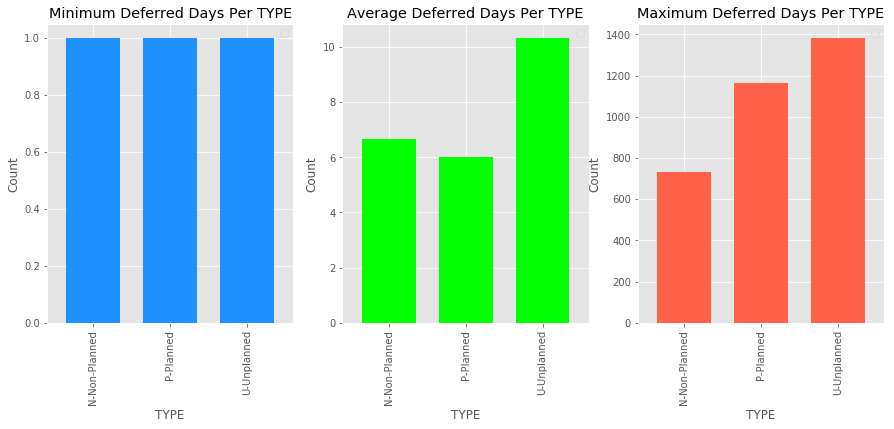

In [48]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,5.5))
    
    ax1=fig.add_subplot(131)
    cdf_final.groupby(by="TYPE").min().plot.bar(y="Deferment_Days_Int", ax=ax1, width=0.7, color="dodgerblue", title="Minimum Deferred Days Per TYPE")
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax2=fig.add_subplot(132)
    cdf_final.groupby(by="TYPE").mean().plot.bar(y="Deferment_Days_Int", ax=ax2, width=0.7, color="lime", title="Average Deferred Days Per TYPE")
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax3=fig.add_subplot(133)
    cdf_final.groupby(by="TYPE").max().plot.bar(y="Deferment_Days_Int", ax=ax3, width=0.7, color="tomato", title="Maximum Deferred Days Per TYPE")
    plt.ylabel("Count")
    plt.legend([],[])

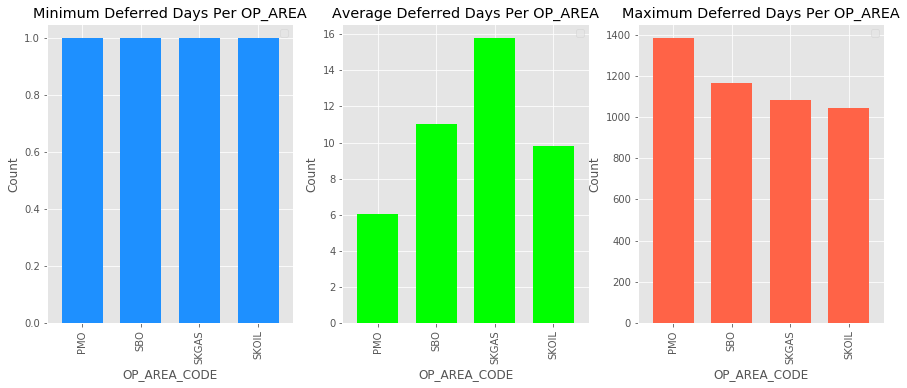

In [49]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,5.5))
    
    ax1=fig.add_subplot(131)
    cdf_final.groupby(by="OP_AREA_CODE").min().plot.bar(y="Deferment_Days_Int", ax=ax1, width=0.7, color="dodgerblue",title="Minimum Deferred Days Per OP_AREA")
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax2=fig.add_subplot(132)
    cdf_final.groupby(by="OP_AREA_CODE").mean().plot.bar(y="Deferment_Days_Int", ax=ax2, width=0.7, color="lime", title="Average Deferred Days Per OP_AREA")
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax3=fig.add_subplot(133)
    cdf_final.groupby(by="OP_AREA_CODE").max().plot.bar(y="Deferment_Days_Int", ax=ax3, width=0.7, color="tomato", title="Maximum Deferred Days Per OP_AREA")
    plt.ylabel("Count")
    plt.legend([],[])

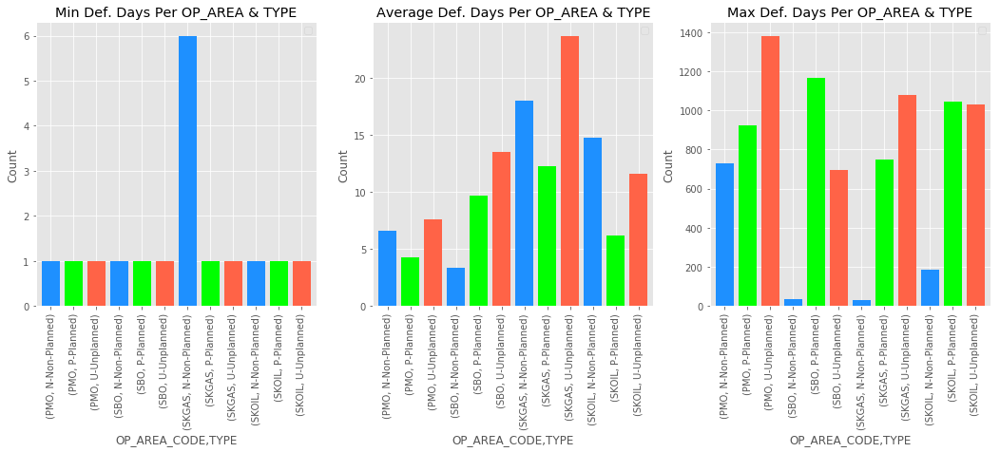

In [50]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(18,5.5))
    
    ax1=fig.add_subplot(131)
    cdf_final.groupby(by=["OP_AREA_CODE", "TYPE"]).min().plot.bar(y="Deferment_Days_Int", title="Min Def. Days Per OP_AREA & TYPE", width=0.8, color=["dodgerblue", "lime", "tomato"], ax=ax1)
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax2=fig.add_subplot(132)
    cdf_final.groupby(by=["OP_AREA_CODE", "TYPE"]).mean().plot.bar(y="Deferment_Days_Int", title="Average Def. Days Per OP_AREA & TYPE", width=0.8, color=["dodgerblue", "lime", "tomato"], ax=ax2)
    plt.ylabel("Count")
    plt.legend([],[])
    
    ax3=fig.add_subplot(133)
    cdf_final.groupby(by=["OP_AREA_CODE", "TYPE"]).max().plot.bar(y="Deferment_Days_Int", title="Max Def. Days Per OP_AREA & TYPE", width=0.8, color=["dodgerblue", "lime", "tomato"], ax=ax3)
    plt.ylabel("Count")
    plt.legend([],[])

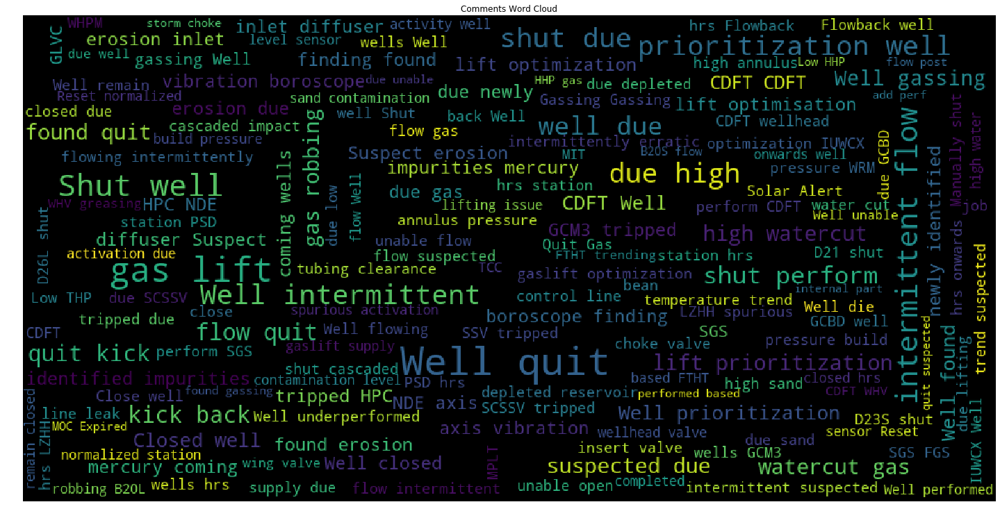

In [51]:
total_corpus = " ".join([comment for comment in cdf_final["COMMENTS"] if isinstance(comment, str)])

wordcloud = WordCloud(width=1000, height=500, 
                      stopwords = STOPWORDS, 
                      #background_color="white",
                      max_words=1000, 
                      min_font_size=12, 
                      max_font_size=40,
                      min_word_length=3).generate(total_corpus) 
  
                       
plt.figure(figsize = (25, 10), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title("Comments Word Cloud")
  
plt.show()

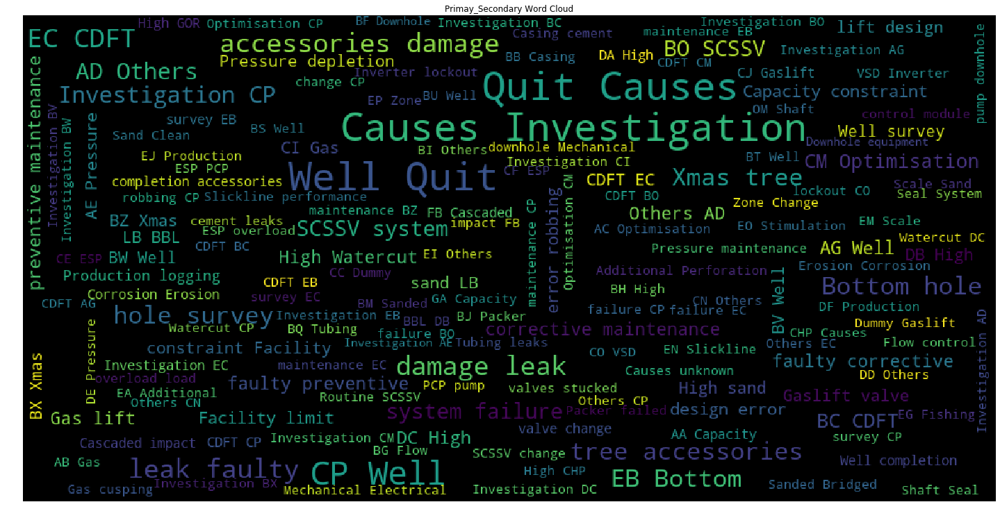

In [52]:
total_corpus = " ".join([comment for comment in cdf_final["PRIMARY_SECONDARY"] if isinstance(comment, str)])

wordcloud = WordCloud(width=1000, height=500, 
                      stopwords = STOPWORDS, 
                      #background_color="white",
                      max_words=1000, 
                      min_font_size=12, 
                      max_font_size=40,
                      min_word_length=2).generate(total_corpus) 
  
                       
plt.figure(figsize = (25, 10), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.title("Primay_Secondary Word Cloud")
  
plt.show()

In [53]:
well_defer_count_overall = cdf_final.groupby(by="CODE").count()[["OP_AREA_CODE"]].rename(columns={"OP_AREA_CODE":"Count"}).sort_values("Count", ascending=False)
well_defer_count_overall.head(10)

,Count
CODE,
DULG-C015-LS,203
DULG-D021S01-TS,195
DULG-B020-SS,174
DULG-C007-LS,152
DULG-D026S01-LS,144
DULG-C015-SS,141
DULG-C006-SS,130
DULG-D023-SS,119
TING-A010S01-TS,118


In [54]:
well_defer_count_2016 = cdf_final.groupby(by=["year","CODE"]).count()[["OP_AREA_CODE"]].rename(columns={"OP_AREA_CODE":"Count_2016"}).loc[2016].sort_values("Count_2016", ascending=False)
well_defer_count_2017 = cdf_final.groupby(by=["year","CODE"]).count()[["OP_AREA_CODE"]].rename(columns={"OP_AREA_CODE":"Count_2017"}).loc[2017].sort_values("Count_2017", ascending=False)
well_defer_count_2018 = cdf_final.groupby(by=["year","CODE"]).count()[["OP_AREA_CODE"]].rename(columns={"OP_AREA_CODE":"Count_2018"}).loc[2018].sort_values("Count_2018", ascending=False)
well_defer_count_2019 = cdf_final.groupby(by=["year","CODE"]).count()[["OP_AREA_CODE"]].rename(columns={"OP_AREA_CODE":"Count_2019"}).loc[2019].sort_values("Count_2019", ascending=False)

In [55]:
top_10_deferred_well_per_year = pd.concat((well_defer_count_2016.head(10).reset_index(), well_defer_count_2017.head(10).reset_index(), well_defer_count_2018.head(10).reset_index(), well_defer_count_2019.head(10).reset_index()), axis=1)
top_10_deferred_well_per_year

,CODE,Count_2016,CODE,Count_2017,CODE,Count_2018,CODE,Count_2019
0,DULG-C006-SS,49,DULG-D021S01-TS,171,TING-A011-LS,54,DULG-C007-LS,103
1,DULG-C015-LS,44,DULG-C015-LS,159,LEDG-A001S01-SS,48,TING-A010S01-TS,75
2,DULG-D030-LS,32,DULG-B020-SS,149,TING-A006S01-TS,46,DULG-B022-SS,51
3,BOKR-C303S01-LS,30,DULG-D026S01-LS,123,TING-A010S01-TS,43,TING-A020-LS,48
4,DULG-C012-SS,29,DULG-D023-SS,118,ANSI-B005-SS,36,BEKK-A001SR1-TS,42
5,DULG-C015-SS,29,DULG-B014-LS,88,DULG-B001-LS,35,BEKK-A002S03-TS,41
6,ANSI-C005S01-SS,28,DULG-C015-SS,81,DULG-B022-SS,33,DULG-C018-SS,37
7,ERBW-A107S03-TS,28,DULG-B018-LS,80,BEKK-B011S01-LS,30,PNAR-A006-SS,36
8,ANSI-A009R01-LS,28,DULG-C003S01-TS,62,ANSI-B015-SS,30,BEKK-C001S01-TS,36
9,ANSI-C003-SS,27,DULG-D030-LS,59,ANSI-B011-SS,28,TING-A022-LS,33


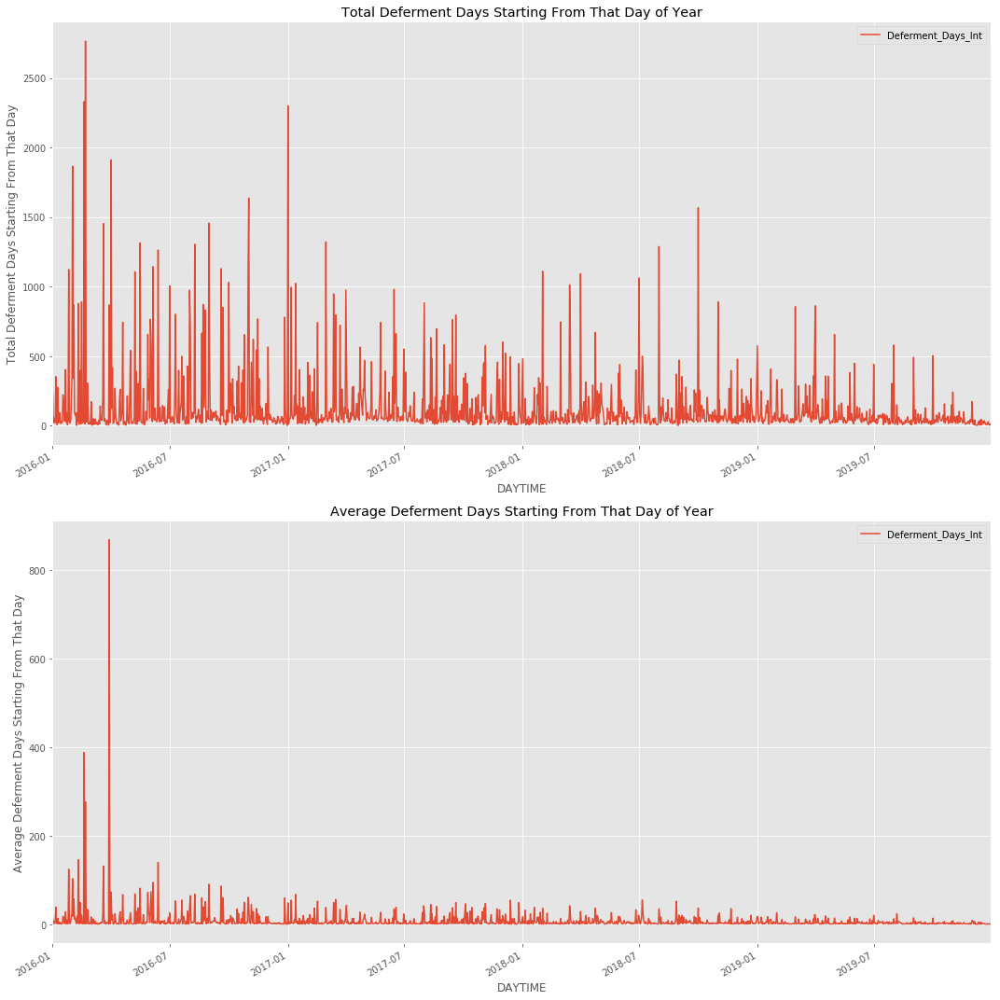

In [56]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,15))
    ax1 = fig.add_subplot(211)
    cdf_final.groupby(by="DAYTIME").sum()[["Deferment_Days_Int"]].plot(ax=ax1)
    plt.ylabel("Total Deferment Days Starting From That Day")
    plt.title("Total Deferment Days Starting From That Day of Year")
    
    ax2 = fig.add_subplot(212)
    cdf_final.groupby(by="DAYTIME").mean()[["Deferment_Days_Int"]].plot(ax=ax2)
    plt.ylabel("Average Deferment Days Starting From That Day")
    plt.title("Average Deferment Days Starting From That Day of Year")
    
    plt.tight_layout()

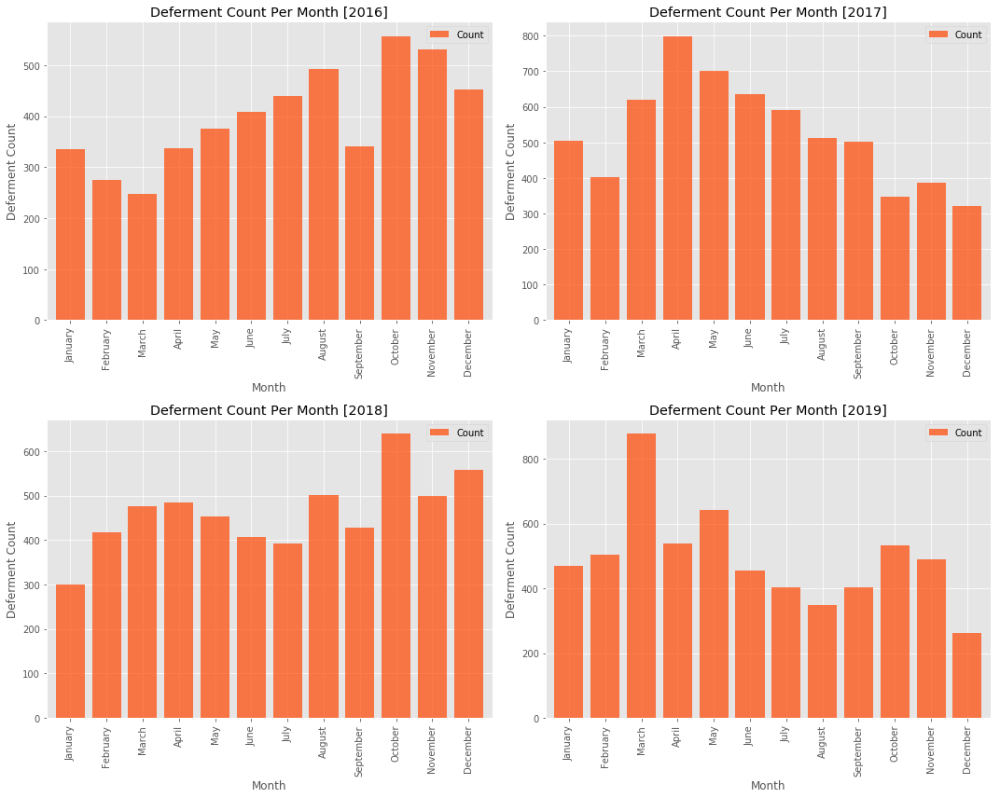

In [57]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,12))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="Month").count()[["CODE"]].rename(columns={"CODE":"Count"})\
            .loc[["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]].plot.bar(color="orangered", alpha=0.7, width=0.8, title="Deferment Count Per Month [%d]"%year, ax=ax)
        plt.ylabel("Deferment Count")
        
    plt.tight_layout()

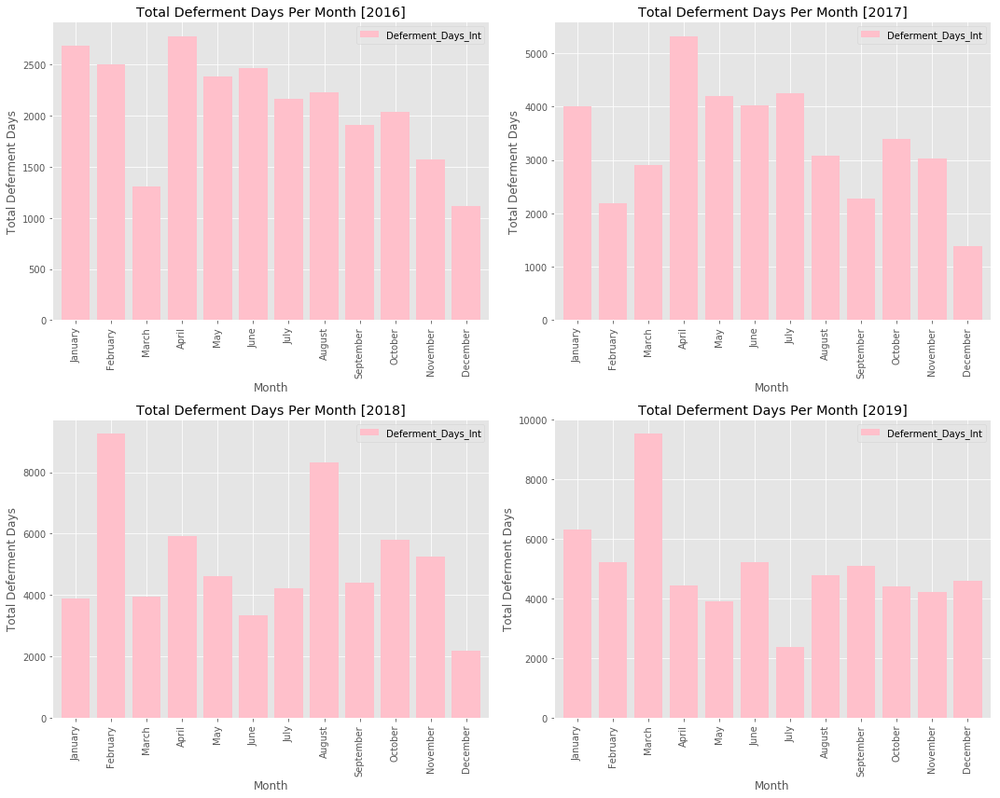

In [58]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(15,12))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="Month").sum()[["Deferment_Days_Int"]]\
            .rename(columns={"Deferment_Days_int":"Total_Deferment_Days"})\
            .loc[["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]]\
            .plot.bar(color="pink", width=0.8, title="Total Deferment Days Per Month [%d]"%year, ax=ax)
        plt.ylabel("Total Deferment Days")
        
    plt.tight_layout()

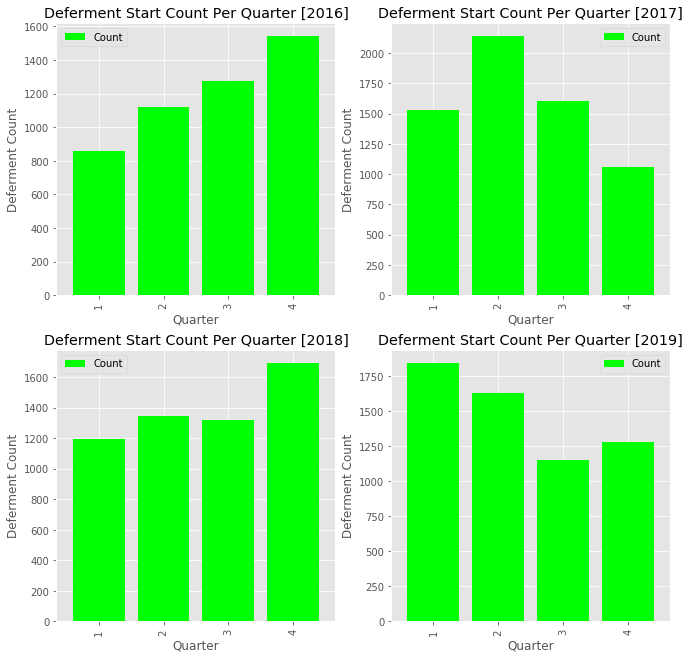

In [59]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(11,11))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="Quarter").count()[["CODE"]].rename(columns={"CODE":"Count"})\
            .loc[[1,2,3,4]].plot.bar(color="lime", width=0.8,
                                     title="Deferment Start Count Per Quarter [%d]"%year, ax=ax)
        plt.ylabel("Deferment Count")

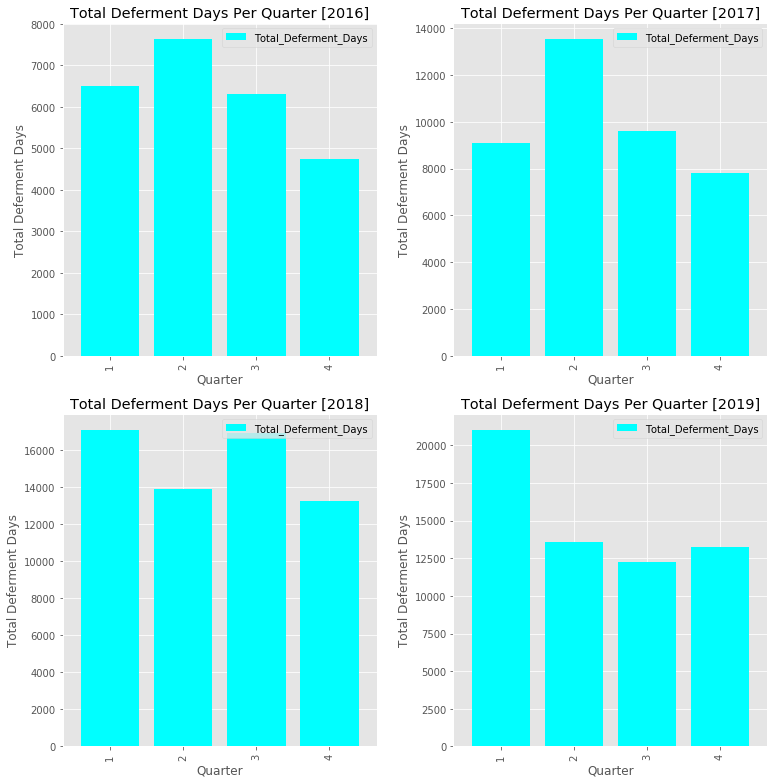

In [60]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(11,11))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(2,2,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="Quarter").sum()[["Deferment_Days_Int"]].rename(columns={"Deferment_Days_Int":"Total_Deferment_Days"})\
            .loc[[1,2,3,4]].plot.bar(color="cyan", width=0.8,
                                     title="Total Deferment Days Per Quarter [%d]"%year, ax=ax)
        plt.ylabel("Total Deferment Days")
    plt.tight_layout()

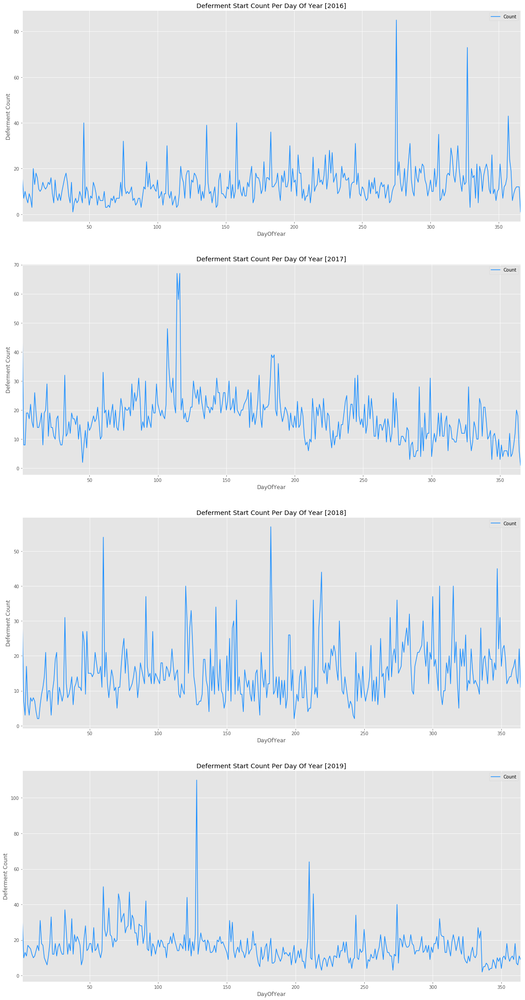

In [61]:
with plt.style.context(("ggplot")):
    fig = plt.figure(figsize=(20,40))
    
    for i, year in enumerate([2016,2017,2018,2019]):
        ax = fig.add_subplot(4,1,i+1)
        cdf_final[cdf_final["year"]==year].groupby(by="DayOfYear").count()[["CODE"]].rename(columns={"CODE":"Count"})\
            .plot(color="dodgerblue", title="Deferment Start Count Per Day Of Year [%d]"%year, ax=ax)
        plt.ylabel("Deferment Count")
        #plt.xticks([],[])

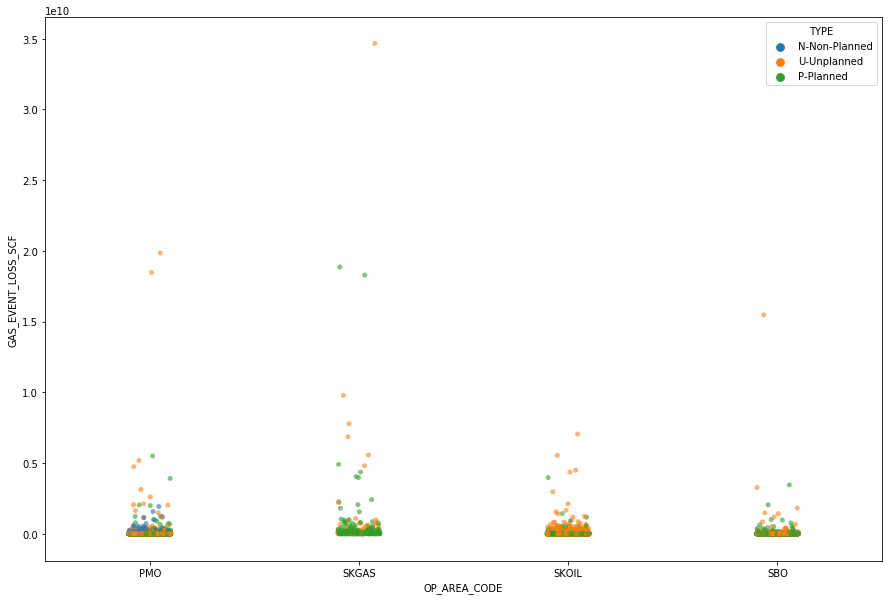

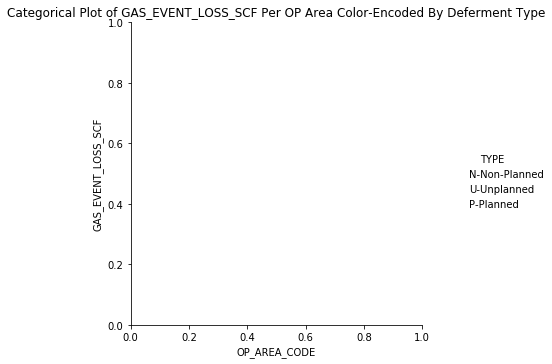

In [70]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.catplot(x="OP_AREA_CODE", y="GAS_EVENT_LOSS_SCF", hue="TYPE", data=cdf_final, alpha=0.6, ax=ax);
plt.title("Categorical Plot of GAS_EVENT_LOSS_SCF Per OP Area Color-Encoded By Deferment Type");

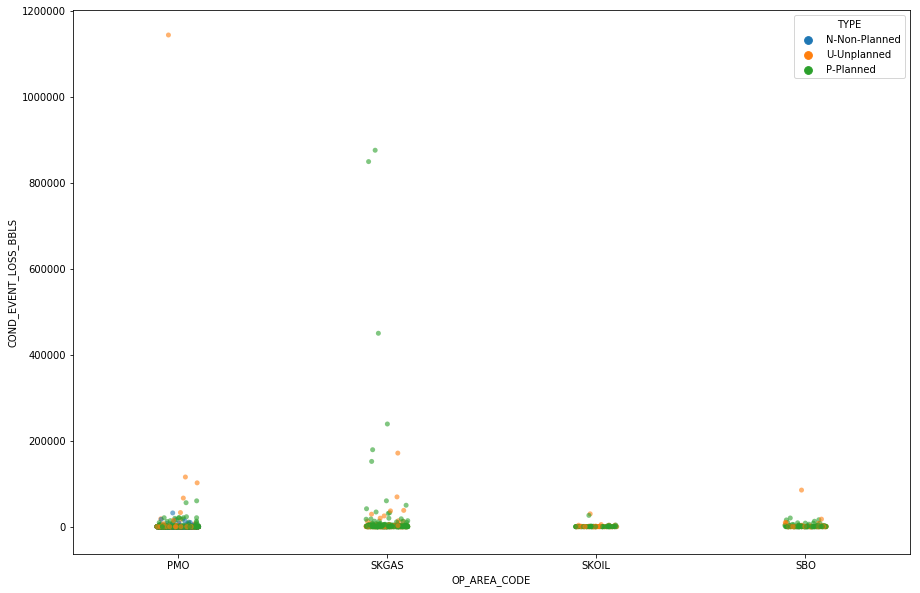

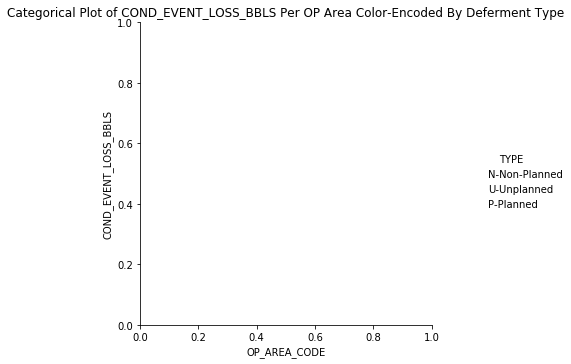

In [69]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.catplot(x="OP_AREA_CODE", y="COND_EVENT_LOSS_BBLS", hue="TYPE", data=cdf_final, alpha=0.6, ax=ax);
plt.title("Categorical Plot of COND_EVENT_LOSS_BBLS Per OP Area Color-Encoded By Deferment Type");

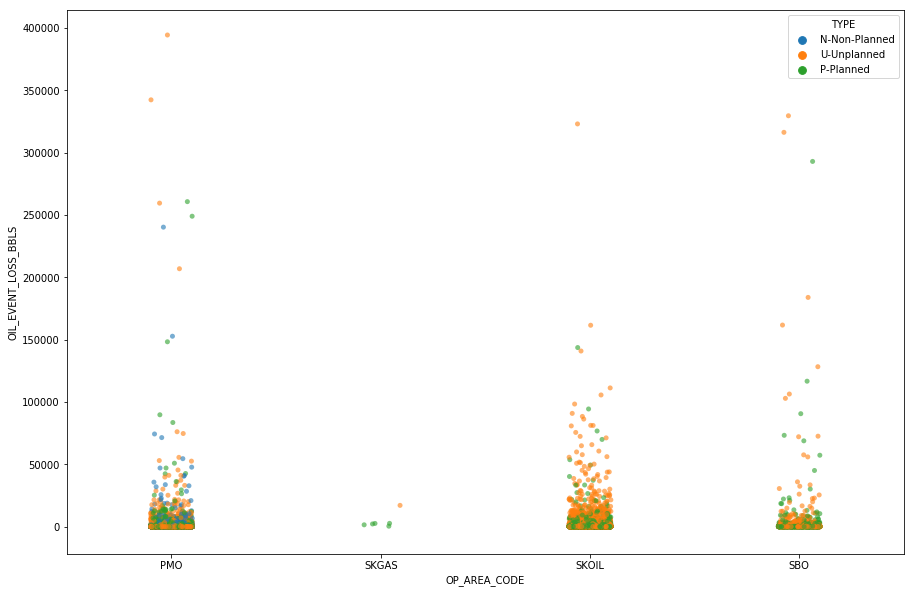

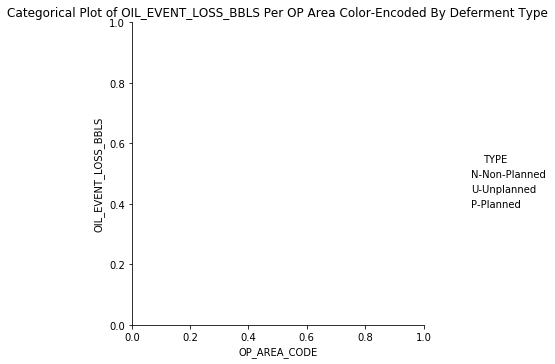

In [71]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(111)
sns.catplot(x="OP_AREA_CODE", y="OIL_EVENT_LOSS_BBLS", hue="TYPE", data=cdf_final, alpha=0.6, ax=ax);
plt.title("Categorical Plot of OIL_EVENT_LOSS_BBLS Per OP Area Color-Encoded By Deferment Type");

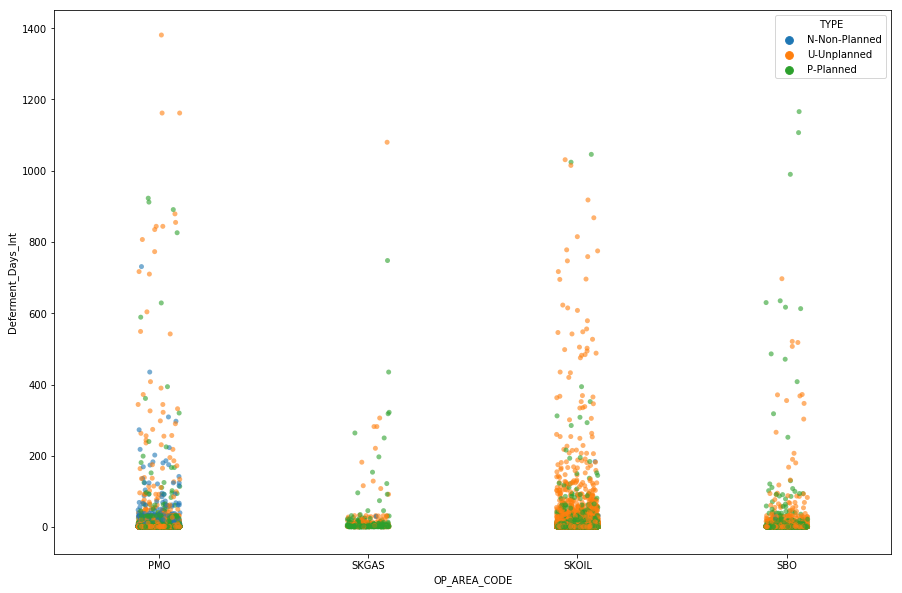

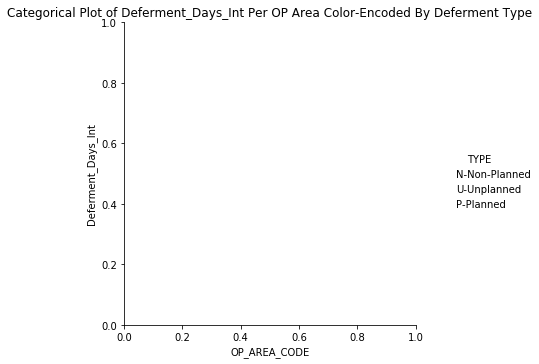

In [72]:
fig = plt.figure(figsize=(15, 10));
ax= fig.add_subplot(1,1,1)
sns.catplot(x="OP_AREA_CODE", y="Deferment_Days_Int", hue="TYPE", data=cdf_final, alpha=0.6, ax=ax);
plt.title("Categorical Plot of Deferment_Days_Int Per OP Area Color-Encoded By Deferment Type");